In [1]:
## Import packages ##
# File I/O
import os
from datetime import datetime

# Data structures and basic operations
import numpy as np
import pandas as pd
import anndata as ad
import scipy.sparse as sp

# Plotting
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

# Runtime warnings
import warnings
warnings.filterwarnings('ignore', category=UserWarning, module='anndata')
warnings.filterwarnings('ignore', category=FutureWarning, module='anndata')

In [2]:
## Directory information ##

# get current working directory
cwd = os.getcwd()

# Change cwd to the base directory
os.chdir(os.path.join(cwd, '..', '..'))

#Input
input_file='test_anndatas/dCas9_m6A_invitro_kinetics.h5ad.gz'

# Output
output_directory='images'

In [3]:
# Get the current date
current_date = datetime.now()
# Format the date as a string
date_string = current_date.strftime("%Y%m%d")
date_string = date_string[2:]

# Define a function to get current timestamp
def time_string(sep=':'):
    current_time = datetime.now()
    return current_time.strftime(f"%H{sep}%M{sep}%S")

In [55]:
## Define functions ##

def adata_to_df(adata, layer=None):
    """
    Takes in an anndata object and returns a dataframe
    """
    # Extract the data matrix
    if layer:
        data_matrix = adata.layers[layer]
    else:
        data_matrix = adata.X
    # Extract observation (read) annotations
    obs_df = adata.obs
    # Extract variable (position) annotations
    var_df = adata.var
    # Convert data matrix and annotations to pandas DataFrames
    df = pd.DataFrame(data_matrix, index=obs_df.index, columns=var_df.index)
    return df

def filter_adata_by_nan_proportion(adata, threshold, axis='obs'):
    if axis == 'obs':
        # Calculate the proportion of NaN values in each read
        nan_proportion = np.isnan(adata.X).mean(axis=1)
        # Filter reads to keep reads with less than a certain NaN proportion
        filtered_indices = np.where(nan_proportion <= threshold)[0]
        filtered_adata = adata[filtered_indices, :]
    elif axis == 'var':
        # Calculate the proportion of NaN values at a given position
        nan_proportion = np.isnan(adata.X).mean(axis=0)
        # Filter positions to keep positions with less than a certain NaN proportion
        filtered_indices = np.where(nan_proportion <= threshold)[0]
        filtered_adata = adata[:, filtered_indices]
    else:
        raise ValueError("Axis must be either 'obs' or 'var'")
    return filtered_adata

# Function to apply a trained HMM to classify features based on the lengths of non-methylated regions
def classify_non_methylated_features(read, model, coordinates):
    sequence = list(read)
    # Get the predicted states using the MAP algorithm
    predicted_states = model.predict(sequence, algorithm='map')
    
    # Get the probabilities for each state using the forward-backward algorithm
    probabilities = model.predict_proba(sequence)
    
    # Initialize lists to store the classifications and their probabilities
    classifications = []
    current_start = None
    current_length = 0
    current_probs = []
    
    for i, state_index in enumerate(predicted_states):
        state_name = model.states[state_index].name
        state_prob = probabilities[i][state_index]
        
        if state_name == "Non-Methylated":
            if current_start is None:
                current_start = i
            current_length += 1
            current_probs.append(state_prob)
        else:
            if current_start is not None:
                avg_prob = np.mean(current_probs)
                classifications.append((current_start, current_length, "Non-Methylated", avg_prob))
                current_start = None
                current_length = 0
                current_probs = []
    
    if current_start is not None:
        avg_prob = np.mean(current_probs)
        classifications.append((current_start, current_length, "Non-Methylated", avg_prob))

    final_classifications = []
    for start, length, classification, prob in classifications:
        if start + length >= len(coordinates):
            continue
        feature_length = int(coordinates[start + length - 1]) - int(coordinates[start]) + 1
        if feature_length < 10 or feature_length > 200:
            continue
        elif 10 <= feature_length <= 30:
            final_classification = "TF"
        elif 30 < feature_length <= 100:
            final_classification = "Complex"
        elif 100 < feature_length <= 200:
            final_classification = "Nucleosomal"
        final_classifications.append((int(coordinates[start]) + 1, feature_length, final_classification, prob))
    
    return final_classifications

def calculate_correlation_matrix(df):
    # Initialize an empty matrix to store the correlation coefficients
    n_cols = len(df.columns)
    correlation_matrix = np.zeros((n_cols, n_cols), dtype=float)
    print('{0}: Calculating correlation matrix'.format(time_string()))
    # Iterate through each pair of columns
    for i in range(n_cols):
        print('{0}: Progress {1}%'.format(time_string(), 100*i/n_cols))
        for j in range(n_cols):
            # Calculate the correlation coefficient for the pair (i, j)
            correlation_matrix[i, j] = df.iloc[:, i].corr(df.iloc[:, j], method='pearson', min_periods=1)
    return correlation_matrix

def pair_heatmap_plot(matrix, title, xlabel, ylabel, save, save_name, cmap='coolwarm', colorbar_label=False, vmax=False):
    fig, axes = plt.subplots(figsize=(12, 6))
    if save:
        dpi = 3000
    else:
        dpi = 300
    fig.set_dpi(dpi)
    if vmax:
        sns.heatmap(matrix, annot=False, cmap=cmap, fmt='.2f', linewidths=0, cbar=True, ax=axes, vmax=vmax)
    else:
        sns.heatmap(matrix, annot=False, cmap=cmap, fmt='.2f', linewidths=0, cbar=True, ax=axes)
    axes.set_title('')
    axes.set_xlabel(xlabel)
    axes.set_ylabel(ylabel)
    axes.tick_params(axis='x', rotation=70)
    fig.suptitle(title)
    if colorbar_label:
        colorbar = axes.collections[0].colorbar
        colorbar.set_label(colorbar_label)
    else:
        pass
    # axes.set_xticks(np.arange(0.5, len(df_sorted.columns)))
    # axes.set_xticklabels(df_sorted.columns)
    # axes.set_yticks(np.arange(0.5, len(df_sorted.columns)))
    # axes.set_yticklabels(df_sorted.columns)
    plt.tight_layout()
    if save:
        fig.savefig(save_name, bbox_inches='tight', pad_inches=0.1)
    else:
        plt.show()
    return

def calculate_combinations_matrix_numpy(df):
    matrix = df.to_numpy()
    matrix = np.nan_to_num(matrix,nan=2)
    n_cols = matrix.shape[1]
    combinations_matrix = np.zeros((n_cols, n_cols, 4))
    print('{0}: Calculating combination matrix'.format(time_string()))
    # Iterate through each pair of columns
    for i in range(n_cols):
        for j in range(n_cols):
            # Count the occurrences of '1-1', '1-0', '0-1', and '0-0' for the pair (i, j)
            count_11 = np.nansum((matrix[:, i] == 1) & (matrix[:, j] == 1))
            count_10 = np.nansum((matrix[:, i] == 1) & (matrix[:, j] == 0))
            count_01 = np.nansum((matrix[:, i] == 0) & (matrix[:, j] == 1))
            count_00 = np.nansum((matrix[:, i] == 0) & (matrix[:, j] == 0))
            
            # Store the counts in the combinations matrix
            combinations_matrix[i, j, 0] = count_11/matrix.shape[0]
            combinations_matrix[i, j, 1] = count_10/matrix.shape[0]
            combinations_matrix[i, j, 2] = count_01/matrix.shape[0]
            combinations_matrix[i, j, 3] = count_00/matrix.shape[0]
    
    return combinations_matrix


In [5]:
## Read in the input h5ad file as adata ##
adata = ad.read_h5ad(input_file)
datasets = set(adata.obs['Dataset'])
print(adata)

AnnData object with n_obs × n_vars = 24490 × 670
    obs: 'Sample', 'Dataset', 'Sample_names'


In [6]:
adata.obs

,Sample,Dataset,Sample_names
770e6271-bee7-4e03-89dc-0d7f5bd3f24a,0,m6A_plus_strand,15min Hia5
b6bc7f78-6241-4b39-943c-b70be185c300,0,m6A_plus_strand,15min Hia5
ce92f4d7-083f-45c0-9529-b0ac2bb93fe3,0,m6A_plus_strand,15min Hia5
c2878519-2529-48fe-86b6-ad6cd0dae54a,0,m6A_plus_strand,15min Hia5
fc161cfa-b2e1-4e83-9c49-33d3387bc51e,0,m6A_plus_strand,15min Hia5
...,...,...,...
0f979bb3-c088-4037-b084-570ad829b0b6,6,m6A_plus_strand,30min No MTase
ea90553d-349a-4760-9da5-7399537eda88,6,m6A_plus_strand,30min No MTase
7a9e24db-2610-455e-b583-1c6584bcda95,6,m6A_plus_strand,30min No MTase
38e29ff2-34d9-4475-a1c0-c41015814ffe,6,m6A_plus_strand,30min No MTase


In [98]:
# Define the mapping from old values to new values for sample names
sample_mapping = {
    '0': '15min Hia5',
    '1': '30min Hia5',
    '2': '15min Tandem',
    '3': '30min Tandem',
    '4': '15min GpC',
    '5': '30min GpC',
    '6': '30min No MTase',
}

# Define the mapping from 'Sample' data to timepoint data
timepoint_mapping = {
    '0': '15',
    '1': '30',
    '2': '15',
    '3': '30',
    '4': '15',
    '5': '30',
    '6': '30',
}

# Define the mapping from 'Sample' data to MTase data
mtase_mapping = {
    '0': 'Hia5',
    '1': 'Hia5',
    '2': 'Tandem',
    '3': 'Tandem',
    '4': 'GpC',
    '5': 'GpC',
    '6': 'No MTase',
}

# Define the mapping from 'Sample' data to condition data
condition_mapping = {
    '0': 'plus',
    '1': 'plus',
    '2': 'plus',
    '3': 'plus',
    '4': 'plus',
    '5': 'plus',
    '6': 'plus',
}

# Create a new observation column based on the mapping
adata.obs['Sample_names'] = adata.obs['Sample'].map(sample_mapping)
sample_names = set(adata.obs['Sample_names'])
timepoint_heading = 'timepoint_min'
mtase_heading = 'MTase'
condition_heading = 'dCas9_status'
adata.obs[timepoint_heading] = adata.obs['Sample'].map(timepoint_mapping)
adata.obs[mtase_heading] = adata.obs['Sample'].map(mtase_mapping)
adata.obs[condition_heading] = adata.obs['Sample'].map(condition_mapping)
adata.obs

,Sample,Dataset,Sample_names,first_valid_position,last_valid_position,read_length,valid_positions_in_read,invalid_positions_in_read,fraction_valid_positions_in_read,read_methylation_count,read_mean_methylation,sum_between_576_and_583,mean_between_576_and_583,binding_status,TF,Complex,Nucleosomal,timepoint_min,MTase,dCas9_status
770e6271-bee7-4e03-89dc-0d7f5bd3f24a,0,m6A_plus_strand,15min Hia5,1241,4194,2954.0,446,218,0.671687,383.0,0.858744,0.0,0.000000,bound,"[(3528, 25, 0.711987197348831), (3698, 25, 0.7...","[(1723, 32, 0.9019317679174387)]",[],15,Hia5,plus
b6bc7f78-6241-4b39-943c-b70be185c300,0,m6A_plus_strand,15min Hia5,1201,4194,2994.0,442,228,0.659701,396.0,0.895928,4.0,0.666667,unbound,[],[],[],15,Hia5,plus
ce92f4d7-083f-45c0-9529-b0ac2bb93fe3,0,m6A_plus_strand,15min Hia5,1201,4194,2994.0,421,249,0.628358,360.0,0.855107,0.0,0.000000,bound,"[(3697, 26, 0.9412072349508592), (3914, 11, 0....","[(3413, 50, 0.8856094931125178)]",[],15,Hia5,plus
c2878519-2529-48fe-86b6-ad6cd0dae54a,0,m6A_plus_strand,15min Hia5,1201,4188,2988.0,387,282,0.578475,310.0,0.801034,0.0,0.000000,bound,"[(2389, 23, 0.8640501529368765)]","[(1641, 35, 0.5837550976090276)]",[],15,Hia5,plus
fc161cfa-b2e1-4e83-9c49-33d3387bc51e,0,m6A_plus_strand,15min Hia5,1201,4194,2994.0,471,199,0.702985,414.0,0.878981,6.0,1.000000,unbound,"[(1962, 11, 0.7182864595467544)]",[],[],15,Hia5,plus
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12612d92-9773-4395-bc00-d925998020a0,6,m6A_plus_strand,30min No MTase,2036,4194,2159.0,371,129,0.742000,15.0,0.040431,1.0,0.142857,unmethylated,[],[],[],30,No MTase,plus
716f1438-064b-45df-b22c-a38b60263ece,6,m6A_plus_strand,30min No MTase,2036,4194,2159.0,351,149,0.702000,15.0,0.042735,0.0,0.000000,unmethylated,[],[],[],30,No MTase,plus
7a9e24db-2610-455e-b583-1c6584bcda95,6,m6A_plus_strand,30min No MTase,2131,4194,2064.0,335,141,0.703782,19.0,0.056716,2.0,0.285714,unmethylated,[],[],[],30,No MTase,plus
38e29ff2-34d9-4475-a1c0-c41015814ffe,6,m6A_plus_strand,30min No MTase,2166,4194,2029.0,345,120,0.741935,16.0,0.046377,0.0,0.000000,unmethylated,[],[],[],30,No MTase,plus


In [8]:
## Add some basic position level metadata and filter out postions that do not confer information

# Remove positions with less than a given valid proportion
filter_positions_on_nan, position_nan_threshold = [True, 0.025]

if filter_positions_on_nan:
    temp_adata = adata.copy()
    print('{0}: Subsetting adata to keep positions with atleast {1} percent of data coverage'.format(time_string(), position_nan_threshold*100))
    print('{0}: Pre subset adata: {1}'.format(time_string(), temp_adata))
    position_valid_read_count = np.sum(~np.isnan(temp_adata.X), axis=0)
    position_invalid_read_count = np.sum(np.isnan(temp_adata.X), axis=0)
    position_valid_fraction = position_valid_read_count / (position_valid_read_count + position_invalid_read_count)
    temp_adata.var['valid_reads'] = pd.Series(position_valid_read_count, index=temp_adata.var.index)
    temp_adata.var['invalid_reads'] = pd.Series(position_invalid_read_count, index=temp_adata.var.index)
    temp_adata.var['fraction_valid_reads'] = pd.Series(position_valid_fraction, index=temp_adata.var.index)
    temp_adata = temp_adata[:, temp_adata.var['fraction_valid_reads'] > position_nan_threshold]
    print('{0}: Post subset adata: {1}'.format(time_string(), temp_adata))

# Bring the changes back to the main adata object
adata = temp_adata.copy()

20:51:14: Subsetting adata to keep positions with atleast 2.5 percent of data coverage
20:51:14: Pre subset adata: AnnData object with n_obs × n_vars = 24490 × 670
    obs: 'Sample', 'Dataset', 'Sample_names'
20:51:14: Post subset adata: View of AnnData object with n_obs × n_vars = 24490 × 670
    obs: 'Sample', 'Dataset', 'Sample_names'
    var: 'valid_reads', 'invalid_reads', 'fraction_valid_reads'


In [9]:
adata.obs

,Sample,Dataset,Sample_names
770e6271-bee7-4e03-89dc-0d7f5bd3f24a,0,m6A_plus_strand,15min Hia5
b6bc7f78-6241-4b39-943c-b70be185c300,0,m6A_plus_strand,15min Hia5
ce92f4d7-083f-45c0-9529-b0ac2bb93fe3,0,m6A_plus_strand,15min Hia5
c2878519-2529-48fe-86b6-ad6cd0dae54a,0,m6A_plus_strand,15min Hia5
fc161cfa-b2e1-4e83-9c49-33d3387bc51e,0,m6A_plus_strand,15min Hia5
...,...,...,...
0f979bb3-c088-4037-b084-570ad829b0b6,6,m6A_plus_strand,30min No MTase
ea90553d-349a-4760-9da5-7399537eda88,6,m6A_plus_strand,30min No MTase
7a9e24db-2610-455e-b583-1c6584bcda95,6,m6A_plus_strand,30min No MTase
38e29ff2-34d9-4475-a1c0-c41015814ffe,6,m6A_plus_strand,30min No MTase


In [10]:
# Add some basic observation-level (read-level) metadata to the anndata object
read_first_valid_postion = np.array([int(adata.var_names[i]) for i in np.argmax(~np.isnan(adata.X), axis=1)])
read_last_valid_postion = np.array([int(adata.var_names[i]) for i in (adata.X.shape[1] - 1 - np.argmax(~np.isnan(adata.X[:, ::-1]), axis=1))])
read_length = read_last_valid_postion - read_first_valid_postion + np.ones(len(read_first_valid_postion))

adata.obs['first_valid_position'] = pd.Series(read_first_valid_postion, index=adata.obs.index)
adata.obs['last_valid_position'] = pd.Series(read_last_valid_postion, index=adata.obs.index)
adata.obs['read_length'] = pd.Series(read_length, index=adata.obs.index)

In [11]:
adata.obs

,Sample,Dataset,Sample_names,first_valid_position,last_valid_position,read_length
770e6271-bee7-4e03-89dc-0d7f5bd3f24a,0,m6A_plus_strand,15min Hia5,1241,4194,2954.0
b6bc7f78-6241-4b39-943c-b70be185c300,0,m6A_plus_strand,15min Hia5,1201,4194,2994.0
ce92f4d7-083f-45c0-9529-b0ac2bb93fe3,0,m6A_plus_strand,15min Hia5,1201,4194,2994.0
c2878519-2529-48fe-86b6-ad6cd0dae54a,0,m6A_plus_strand,15min Hia5,1201,4188,2988.0
fc161cfa-b2e1-4e83-9c49-33d3387bc51e,0,m6A_plus_strand,15min Hia5,1201,4194,2994.0
...,...,...,...,...,...,...
0f979bb3-c088-4037-b084-570ad829b0b6,6,m6A_plus_strand,30min No MTase,2048,4194,2147.0
ea90553d-349a-4760-9da5-7399537eda88,6,m6A_plus_strand,30min No MTase,2107,4194,2088.0
7a9e24db-2610-455e-b583-1c6584bcda95,6,m6A_plus_strand,30min No MTase,2131,4194,2064.0
38e29ff2-34d9-4475-a1c0-c41015814ffe,6,m6A_plus_strand,30min No MTase,2166,4194,2029.0


In [12]:
## Filtering adata on coordinate-windows 

## Parameters ##
# Filter to keep a specified coordinate range, if None is provided, lowest and highest valid postions will be used
filter_on_coordinates, lower_bound, upper_bound = [True, None, None]
##

if filter_on_coordinates:
    # Subset and keep positions within the specified coordinate range
    if not upper_bound:
        upper_bound = int(np.nanmax(adata.obs['last_valid_position']))
    if not lower_bound:
        lower_bound = int(np.nanmin(adata.obs['first_valid_position']))
    position_list = list(range(lower_bound, upper_bound + 1))
    position_list = [str(pos) for pos in position_list]
    position_set = set(position_list)
    print('{0}: Subsetting adata to keep data between coordinates {1} and {2}'.format(time_string(), lower_bound, upper_bound))
    adata = adata[:, adata.var_names.isin(position_set)].copy()
    print('{0}: adata {1}'.format(time_string(), adata))

20:51:17: Subsetting adata to keep data between coordinates 1201 and 4194
20:51:18: adata AnnData object with n_obs × n_vars = 24490 × 670
    obs: 'Sample', 'Dataset', 'Sample_names', 'first_valid_position', 'last_valid_position', 'read_length'
    var: 'valid_reads', 'invalid_reads', 'fraction_valid_reads'


In [13]:
adata.var

,valid_reads,invalid_reads,fraction_valid_reads
1201,17994,6496,0.734749
1219,22507,1983,0.919028
1221,19686,4804,0.803838
1230,16315,8175,0.666190
1232,15333,9157,0.626092
...,...,...,...
4178,16160,8330,0.659861
4179,19038,5452,0.777379
4181,16991,7499,0.693793
4188,20822,3668,0.850225


In [18]:
## Add some basic read level metadata

temp_adata = None
for dataset in datasets:
    dataset_adata = adata[adata.obs['Dataset'] == dataset].copy()
    # Valid position stats
    valid_positions_in_interval, invalid_positions_in_interval, fraction_valid_positions_in_interval = [],[],[]
    # Methylation stats
    methylation_counts_in_interval, mean_methylation_in_interval = [],[]
    for i in range(dataset_adata.X.shape[0]):
        # Define read intervals
        start = np.argmax(~np.isnan(dataset_adata.X[i]))
        end = dataset_adata.X.shape[1] - 1 - np.argmax(~np.isnan(dataset_adata.X[i, ::-1]))
        interval = dataset_adata.X[i, start:end+1]
        # Count valid positions in read
        valid_count = np.sum(~np.isnan(interval))
        invalid_count = np.sum(np.isnan(interval))
        fraction = valid_count / (valid_count + invalid_count)
        # Add position data to list
        valid_positions_in_interval.append(valid_count)
        invalid_positions_in_interval.append(invalid_count)
        fraction_valid_positions_in_interval.append(fraction)
        # Methylation stats in read
        read_methylation_count = np.nansum(interval)
        read_methylation_mean = np.nanmean(interval)
        # Add methylation data to list
        methylation_counts_in_interval.append(read_methylation_count)
        mean_methylation_in_interval.append(read_methylation_mean)

    dataset_adata.obs['valid_positions_in_read'] = pd.Series(valid_positions_in_interval, index=dataset_adata.obs.index)
    dataset_adata.obs['invalid_positions_in_read'] = pd.Series(invalid_positions_in_interval, index=dataset_adata.obs.index)
    dataset_adata.obs['fraction_valid_positions_in_read'] = pd.Series(fraction_valid_positions_in_interval, index=dataset_adata.obs.index)
    dataset_adata.obs['read_methylation_count'] = pd.Series(methylation_counts_in_interval, index=dataset_adata.obs.index)
    dataset_adata.obs['read_mean_methylation'] = pd.Series(mean_methylation_in_interval, index=dataset_adata.obs.index)
    
    if temp_adata:
        temp_adata = ad.concat([temp_adata, dataset_adata], join='outer')
    else:
        temp_adata = dataset_adata.copy()

adata = temp_adata.copy()
adata.obs

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

2670
2671
2672
2673
2674
2675
2676
2677
2678
2679
2680
2681
2682
2683
2684
2685
2686
2687
2688
2689
2690
2691
2692
2693
2694
2695
2696
2697
2698
2699
2700
2701
2702
2703
2704
2705
2706
2707
2708
2709
2710
2711
2712
2713
2714
2715
2716
2717
2718
2719
2720
2721
2722
2723
2724
2725
2726
2727
2728
2729
2730
2731
2732
2733
2734
2735
2736
2737
2738
2739
2740
2741
2742
2743
2744
2745
2746
2747
2748
2749
2750
2751
2752
2753
2754
2755
2756
2757
2758
2759
2760
2761
2762
2763
2764
2765
2766
2767
2768
2769
2770
2771
2772
2773
2774
2775
2776
2777
2778
2779
2780
2781
2782
2783
2784
2785
2786
2787
2788
2789
2790
2791
2792
2793
2794
2795
2796
2797
2798
2799
2800
2801
2802
2803
2804
2805
2806
2807
2808
2809
2810
2811
2812
2813
2814
2815
2816
2817
2818
2819
2820
2821
2822
2823
2824
2825
2826
2827
2828
2829
2830
2831
2832
2833
2834
2835
2836
2837
2838
2839
2840
2841
2842
2843
2844
2845
2846
2847
2848
2849
2850
2851
2852
2853
2854
2855
2856
2857
2858
2859
2860
2861
2862
2863
2864
2865
2866
2867
2868
2869


5110
5111
5112
5113
5114
5115
5116
5117
5118
5119
5120
5121
5122
5123
5124
5125
5126
5127
5128
5129
5130
5131
5132
5133
5134
5135
5136
5137
5138
5139
5140
5141
5142
5143
5144
5145
5146
5147
5148
5149
5150
5151
5152
5153
5154
5155
5156
5157
5158
5159
5160
5161
5162
5163
5164
5165
5166
5167
5168
5169
5170
5171
5172
5173
5174
5175
5176
5177
5178
5179
5180
5181
5182
5183
5184
5185
5186
5187
5188
5189
5190
5191
5192
5193
5194
5195
5196
5197
5198
5199
5200
5201
5202
5203
5204
5205
5206
5207
5208
5209
5210
5211
5212
5213
5214
5215
5216
5217
5218
5219
5220
5221
5222
5223
5224
5225
5226
5227
5228
5229
5230
5231
5232
5233
5234
5235
5236
5237
5238
5239
5240
5241
5242
5243
5244
5245
5246
5247
5248
5249
5250
5251
5252
5253
5254
5255
5256
5257
5258
5259
5260
5261
5262
5263
5264
5265
5266
5267
5268
5269
5270
5271
5272
5273
5274
5275
5276
5277
5278
5279
5280
5281
5282
5283
5284
5285
5286
5287
5288
5289
5290
5291
5292
5293
5294
5295
5296
5297
5298
5299
5300
5301
5302
5303
5304
5305
5306
5307
5308
5309


7597
7598
7599
7600
7601
7602
7603
7604
7605
7606
7607
7608
7609
7610
7611
7612
7613
7614
7615
7616
7617
7618
7619
7620
7621
7622
7623
7624
7625
7626
7627
7628
7629
7630
7631
7632
7633
7634
7635
7636
7637
7638
7639
7640
7641
7642
7643
7644
7645
7646
7647
7648
7649
7650
7651
7652
7653
7654
7655
7656
7657
7658
7659
7660
7661
7662
7663
7664
7665
7666
7667
7668
7669
7670
7671
7672
7673
7674
7675
7676
7677
7678
7679
7680
7681
7682
7683
7684
7685
7686
7687
7688
7689
7690
7691
7692
7693
7694
7695
7696
7697
7698
7699
7700
7701
7702
7703
7704
7705
7706
7707
7708
7709
7710
7711
7712
7713
7714
7715
7716
7717
7718
7719
7720
7721
7722
7723
7724
7725
7726
7727
7728
7729
7730
7731
7732
7733
7734
7735
7736
7737
7738
7739
7740
7741
7742
7743
7744
7745
7746
7747
7748
7749
7750
7751
7752
7753
7754
7755
7756
7757
7758
7759
7760
7761
7762
7763
7764
7765
7766
7767
7768
7769
7770
7771
7772
7773
7774
7775
7776
7777
7778
7779
7780
7781
7782
7783
7784
7785
7786
7787
7788
7789
7790
7791
7792
7793
7794
7795
7796


9677
9678
9679
9680
9681
9682
9683
9684
9685
9686
9687
9688
9689
9690
9691
9692
9693
9694
9695
9696
9697
9698
9699
9700
9701
9702
9703
9704
9705
9706
9707
9708
9709
9710
9711
9712
9713
9714
9715
9716
9717
9718
9719
9720
9721
9722
9723
9724
9725
9726
9727
9728
9729
9730
9731
9732
9733
9734
9735
9736
9737
9738
9739
9740
9741
9742
9743
9744
9745
9746
9747
9748
9749
9750
9751
9752
9753
9754
9755
9756
9757
9758
9759
9760
9761
9762
9763
9764
9765
9766
9767
9768
9769
9770
9771
9772
9773
9774
9775
9776
9777
9778
9779
9780
9781
9782
9783
9784
9785
9786
9787
9788
9789
9790
9791
9792
9793
9794
9795
9796
9797
9798
9799
9800
9801
9802
9803
9804
9805
9806
9807
9808
9809
9810
9811
9812
9813
9814
9815
9816
9817
9818
9819
9820
9821
9822
9823
9824
9825
9826
9827
9828
9829
9830
9831
9832
9833
9834
9835
9836
9837
9838
9839
9840
9841
9842
9843
9844
9845
9846
9847
9848
9849
9850
9851
9852
9853
9854
9855
9856
9857
9858
9859
9860
9861
9862
9863
9864
9865
9866
9867
9868
9869
9870
9871
9872
9873
9874
9875
9876


12308
12309
12310
12311
12312
12313
12314
12315
12316
12317
12318
12319
12320
12321
12322
12323
12324
12325
12326
12327
12328
12329
12330
12331
12332
12333
12334
12335
12336
12337
12338
12339
12340
12341
12342
12343
12344
12345
12346
12347
12348
12349
12350
12351
12352
12353
12354
12355
12356
12357
12358
12359
12360
12361
12362
12363
12364
12365
12366
12367
12368
12369
12370
12371
12372
12373
12374
12375
12376
12377
12378
12379
12380
12381
12382
12383
12384
12385
12386
12387
12388
12389
12390
12391
12392
12393
12394
12395
12396
12397
12398
12399
12400
12401
12402
12403
12404
12405
12406
12407
12408
12409
12410
12411
12412
12413
12414
12415
12416
12417
12418
12419
12420
12421
12422
12423
12424
12425
12426
12427
12428
12429
12430
12431
12432
12433
12434
12435
12436
12437
12438
12439
12440
12441
12442
12443
12444
12445
12446
12447
12448
12449
12450
12451
12452
12453
12454
12455
12456
12457
12458
12459
12460
12461
12462
12463
12464
12465
12466
12467
12468
12469
12470
12471
12472
12473
1247

14655
14656
14657
14658
14659
14660
14661
14662
14663
14664
14665
14666
14667
14668
14669
14670
14671
14672
14673
14674
14675
14676
14677
14678
14679
14680
14681
14682
14683
14684
14685
14686
14687
14688
14689
14690
14691
14692
14693
14694
14695
14696
14697
14698
14699
14700
14701
14702
14703
14704
14705
14706
14707
14708
14709
14710
14711
14712
14713
14714
14715
14716
14717
14718
14719
14720
14721
14722
14723
14724
14725
14726
14727
14728
14729
14730
14731
14732
14733
14734
14735
14736
14737
14738
14739
14740
14741
14742
14743
14744
14745
14746
14747
14748
14749
14750
14751
14752
14753
14754
14755
14756
14757
14758
14759
14760
14761
14762
14763
14764
14765
14766
14767
14768
14769
14770
14771
14772
14773
14774
14775
14776
14777
14778
14779
14780
14781
14782
14783
14784
14785
14786
14787
14788
14789
14790
14791
14792
14793
14794
14795
14796
14797
14798
14799
14800
14801
14802
14803
14804
14805
14806
14807
14808
14809
14810
14811
14812
14813
14814
14815
14816
14817
14818
14819
14820
1482

16963
16964
16965
16966
16967
16968
16969
16970
16971
16972
16973
16974
16975
16976
16977
16978
16979
16980
16981
16982
16983
16984
16985
16986
16987
16988
16989
16990
16991
16992
16993
16994
16995
16996
16997
16998
16999
17000
17001
17002
17003
17004
17005
17006
17007
17008
17009
17010
17011
17012
17013
17014
17015
17016
17017
17018
17019
17020
17021
17022
17023
17024
17025
17026
17027
17028
17029
17030
17031
17032
17033
17034
17035
17036
17037
17038
17039
17040
17041
17042
17043
17044
17045
17046
17047
17048
17049
17050
17051
17052
17053
17054
17055
17056
17057
17058
17059
17060
17061
17062
17063
17064
17065
17066
17067
17068
17069
17070
17071
17072
17073
17074
17075
17076
17077
17078
17079
17080
17081
17082
17083
17084
17085
17086
17087
17088
17089
17090
17091
17092
17093
17094
17095
17096
17097
17098
17099
17100
17101
17102
17103
17104
17105
17106
17107
17108
17109
17110
17111
17112
17113
17114
17115
17116
17117
17118
17119
17120
17121
17122
17123
17124
17125
17126
17127
17128
1712

18365
18366
18367
18368
18369
18370
18371
18372
18373
18374
18375
18376
18377
18378
18379
18380
18381
18382
18383
18384
18385
18386
18387
18388
18389
18390
18391
18392
18393
18394
18395
18396
18397
18398
18399
18400
18401
18402
18403
18404
18405
18406
18407
18408
18409
18410
18411
18412
18413
18414
18415
18416
18417
18418
18419
18420
18421
18422
18423
18424
18425
18426
18427
18428
18429
18430
18431
18432
18433
18434
18435
18436
18437
18438
18439
18440
18441
18442
18443
18444
18445
18446
18447
18448
18449
18450
18451
18452
18453
18454
18455
18456
18457
18458
18459
18460
18461
18462
18463
18464
18465
18466
18467
18468
18469
18470
18471
18472
18473
18474
18475
18476
18477
18478
18479
18480
18481
18482
18483
18484
18485
18486
18487
18488
18489
18490
18491
18492
18493
18494
18495
18496
18497
18498
18499
18500
18501
18502
18503
18504
18505
18506
18507
18508
18509
18510
18511
18512
18513
18514
18515
18516
18517
18518
18519
18520
18521
18522
18523
18524
18525
18526
18527
18528
18529
18530
1853

20864
20865
20866
20867
20868
20869
20870
20871
20872
20873
20874
20875
20876
20877
20878
20879
20880
20881
20882
20883
20884
20885
20886
20887
20888
20889
20890
20891
20892
20893
20894
20895
20896
20897
20898
20899
20900
20901
20902
20903
20904
20905
20906
20907
20908
20909
20910
20911
20912
20913
20914
20915
20916
20917
20918
20919
20920
20921
20922
20923
20924
20925
20926
20927
20928
20929
20930
20931
20932
20933
20934
20935
20936
20937
20938
20939
20940
20941
20942
20943
20944
20945
20946
20947
20948
20949
20950
20951
20952
20953
20954
20955
20956
20957
20958
20959
20960
20961
20962
20963
20964
20965
20966
20967
20968
20969
20970
20971
20972
20973
20974
20975
20976
20977
20978
20979
20980
20981
20982
20983
20984
20985
20986
20987
20988
20989
20990
20991
20992
20993
20994
20995
20996
20997
20998
20999
21000
21001
21002
21003
21004
21005
21006
21007
21008
21009
21010
21011
21012
21013
21014
21015
21016
21017
21018
21019
21020
21021
21022
21023
21024
21025
21026
21027
21028
21029
2103

23122
23123
23124
23125
23126
23127
23128
23129
23130
23131
23132
23133
23134
23135
23136
23137
23138
23139
23140
23141
23142
23143
23144
23145
23146
23147
23148
23149
23150
23151
23152
23153
23154
23155
23156
23157
23158
23159
23160
23161
23162
23163
23164
23165
23166
23167
23168
23169
23170
23171
23172
23173
23174
23175
23176
23177
23178
23179
23180
23181
23182
23183
23184
23185
23186
23187
23188
23189
23190
23191
23192
23193
23194
23195
23196
23197
23198
23199
23200
23201
23202
23203
23204
23205
23206
23207
23208
23209
23210
23211
23212
23213
23214
23215
23216
23217
23218
23219
23220
23221
23222
23223
23224
23225
23226
23227
23228
23229
23230
23231
23232
23233
23234
23235
23236
23237
23238
23239
23240
23241
23242
23243
23244
23245
23246
23247
23248
23249
23250
23251
23252
23253
23254
23255
23256
23257
23258
23259
23260
23261
23262
23263
23264
23265
23266
23267
23268
23269
23270
23271
23272
23273
23274
23275
23276
23277
23278
23279
23280
23281
23282
23283
23284
23285
23286
23287
2328

,Sample,Dataset,Sample_names,first_valid_position,last_valid_position,read_length,valid_positions_in_read,invalid_positions_in_read,fraction_valid_positions_in_read,read_methylation_count,read_mean_methylation
770e6271-bee7-4e03-89dc-0d7f5bd3f24a,0,m6A_plus_strand,15min Hia5,1241,4194,2954.0,446,218,0.671687,383.0,0.858744
b6bc7f78-6241-4b39-943c-b70be185c300,0,m6A_plus_strand,15min Hia5,1201,4194,2994.0,442,228,0.659701,396.0,0.895928
ce92f4d7-083f-45c0-9529-b0ac2bb93fe3,0,m6A_plus_strand,15min Hia5,1201,4194,2994.0,421,249,0.628358,360.0,0.855107
c2878519-2529-48fe-86b6-ad6cd0dae54a,0,m6A_plus_strand,15min Hia5,1201,4188,2988.0,387,282,0.578475,310.0,0.801034
fc161cfa-b2e1-4e83-9c49-33d3387bc51e,0,m6A_plus_strand,15min Hia5,1201,4194,2994.0,471,199,0.702985,414.0,0.878981
...,...,...,...,...,...,...,...,...,...,...,...
0f979bb3-c088-4037-b084-570ad829b0b6,6,m6A_plus_strand,30min No MTase,2048,4194,2147.0,387,109,0.780242,15.0,0.038760
ea90553d-349a-4760-9da5-7399537eda88,6,m6A_plus_strand,30min No MTase,2107,4194,2088.0,345,136,0.717256,12.0,0.034783
7a9e24db-2610-455e-b583-1c6584bcda95,6,m6A_plus_strand,30min No MTase,2131,4194,2064.0,335,141,0.703782,19.0,0.056716
38e29ff2-34d9-4475-a1c0-c41015814ffe,6,m6A_plus_strand,30min No MTase,2166,4194,2029.0,345,120,0.741935,16.0,0.046377


In [19]:
## Filtering adata to keep certain observation types, coordinate ranges, and reads/positions with a maximal np.nan content

## Parameters ##
# Remove reads that have less than the given valid frequency
filter_reads_on_nan, read_nan_threshold = [True, 0.01] 
# Remove reads that have less than the given methylation mean
filter_reads_mean_methylation, read_meth_threshold = [True, 0.04] 
# Define the observation type of interest and define which observation values you want to keep

if filter_reads_on_nan:
    # Remove reads below a certain valid position fraction
    print('{0}: Subsetting adata to keep reads with atleast {1} percent of data for coordinates in the defined window'.format(time_string(), read_nan_threshold*100))
    adata = adata[adata.obs['fraction_valid_positions_in_read'] > read_nan_threshold]
    print('{0}: adata {1}'.format(time_string(), adata))

if filter_reads_mean_methylation:
    # Remove reads below a certain methylation mean
    print('{0}: Subsetting adata to keep reads with at least {1} percent methylation'.format(time_string(), read_meth_threshold*100))
    adata = adata[adata.obs['read_mean_methylation'] > read_meth_threshold]
    print('{0}: adata_subset {1}'.format(time_string(), adata))


21:00:22: Subsetting adata to keep reads with atleast 1.0 percent of data for coordinates in the defined window
21:00:22: adata View of AnnData object with n_obs × n_vars = 24490 × 670
    obs: 'Sample', 'Dataset', 'Sample_names', 'first_valid_position', 'last_valid_position', 'read_length', 'valid_positions_in_read', 'invalid_positions_in_read', 'fraction_valid_positions_in_read', 'read_methylation_count', 'read_mean_methylation'
    var: 'valid_reads', 'invalid_reads', 'fraction_valid_reads'
21:00:22: Subsetting adata to keep reads with at least 4.0 percent methylation
21:00:22: adata_subset View of AnnData object with n_obs × n_vars = 21222 × 670
    obs: 'Sample', 'Dataset', 'Sample_names', 'first_valid_position', 'last_valid_position', 'read_length', 'valid_positions_in_read', 'invalid_positions_in_read', 'fraction_valid_positions_in_read', 'read_methylation_count', 'read_mean_methylation'
    var: 'valid_reads', 'invalid_reads', 'fraction_valid_reads'


In [20]:
# Take the filtered adata obects and create an object that replaces np.nan values with a replacement strategy of interest.
## Parameters ##
# Choose one of the nan fill strategies that you want to use.
nan0_0minus1= True # replaces 0 values with -1 values. Replaces nan values with 0 values.
nan1_12= True # replaces nan values with 1 values. Replaces 1 values with 2 values.
fill_nans_closest = True # Forward and back fills np.nan values in reads with closest positional identitities.
#################
if fill_nans_closest:
    print('{0}: Filling nan values in adata_subset with nearest positional methylation state values'.format(time_string()))
    df = pd.DataFrame(adata.X)
    df = df.ffill(axis=1).bfill(axis=1)
    adata.layers['fill_nans_closest'] = df.values
if nan0_0minus1:
    print('{0}: Changing non methlylated values (ie 0) to -1 and filling nan values in adata_subset with 0'.format(time_string()))
    old_value, new_value = [0, -1]
    df = adata_to_df(adata)
    df = df.replace(old_value, new_value)
    old_value, new_value = [np.nan, 0]
    df = df.replace(old_value, new_value)
    adata.layers['nan0_0minus1'] = df.values
if nan1_12:
    print('{0}: Changing np.nan values to 1 and 1 values to 2'.format(time_string()))
    old_value, new_value = [1, 2]
    df = adata_to_df(adata)
    df = df.replace(old_value, new_value)
    old_value, new_value = [np.nan, 1]
    df = df.replace(old_value, new_value)
    adata.layers['nan1_12'] = df.values

21:00:24: Filling nan values in adata_subset with nearest positional methylation state values


/var/folders/xs/t9v34m4x6g3d0qh5vm__7trc0000gn/T/ipykernel_24201/2278496357.py:12: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata.layers['fill_nans_closest'] = df.values


21:00:25: Changing non methlylated values (ie 0) to -1 and filling nan values in adata_subset with 0
21:00:25: Changing np.nan values to 1 and 1 values to 2


In [21]:
adata.obs

,Sample,Dataset,Sample_names,first_valid_position,last_valid_position,read_length,valid_positions_in_read,invalid_positions_in_read,fraction_valid_positions_in_read,read_methylation_count,read_mean_methylation
770e6271-bee7-4e03-89dc-0d7f5bd3f24a,0,m6A_plus_strand,15min Hia5,1241,4194,2954.0,446,218,0.671687,383.0,0.858744
b6bc7f78-6241-4b39-943c-b70be185c300,0,m6A_plus_strand,15min Hia5,1201,4194,2994.0,442,228,0.659701,396.0,0.895928
ce92f4d7-083f-45c0-9529-b0ac2bb93fe3,0,m6A_plus_strand,15min Hia5,1201,4194,2994.0,421,249,0.628358,360.0,0.855107
c2878519-2529-48fe-86b6-ad6cd0dae54a,0,m6A_plus_strand,15min Hia5,1201,4188,2988.0,387,282,0.578475,310.0,0.801034
fc161cfa-b2e1-4e83-9c49-33d3387bc51e,0,m6A_plus_strand,15min Hia5,1201,4194,2994.0,471,199,0.702985,414.0,0.878981
...,...,...,...,...,...,...,...,...,...,...,...
12612d92-9773-4395-bc00-d925998020a0,6,m6A_plus_strand,30min No MTase,2036,4194,2159.0,371,129,0.742000,15.0,0.040431
716f1438-064b-45df-b22c-a38b60263ece,6,m6A_plus_strand,30min No MTase,2036,4194,2159.0,351,149,0.702000,15.0,0.042735
7a9e24db-2610-455e-b583-1c6584bcda95,6,m6A_plus_strand,30min No MTase,2131,4194,2064.0,335,141,0.703782,19.0,0.056716
38e29ff2-34d9-4475-a1c0-c41015814ffe,6,m6A_plus_strand,30min No MTase,2166,4194,2029.0,345,120,0.741935,16.0,0.046377


In [22]:
## Append methylation sums within an ROI and classify if the ROI is bound, unbound, or unmethylated
create_labels = True
if create_labels:
    # Convert var_names to an array of integers
    arr = adata.var_names.astype(int).to_numpy()
    # Find indices of the anndata object closest to the coordinates of interest
    start_range = 3694
    closest_start_index = np.argmin(np.abs(arr - start_range))
    end_range = 3721
    closest_end_index = np.argmin(np.abs(arr - end_range))

    # Slice the data matrix to get the values within the interval
    data_slice = adata.X[:, closest_start_index:closest_end_index + 1]

    # Calculate the sum and mean across the columns in the slice
    sum_across_interval = np.nansum(data_slice, axis=1)
    mean_across_interval = np.nanmean(data_slice, axis=1)

    # Create a new observation metadata column with the sums and means
    adata.obs[f'sum_between_{closest_start_index}_and_{closest_end_index}'] = sum_across_interval
    adata.obs[f'mean_between_{closest_start_index}_and_{closest_end_index}'] = mean_across_interval

    region_mean_title = f'mean_between_{closest_start_index}_and_{closest_end_index}'

    # Create a new observation column based on conditions
    threshold = 0.3
    conditions = [
        (adata.obs[region_mean_title] < threshold) & (adata.obs['read_mean_methylation'] < threshold),  # Condition 1: unmethylated
        (adata.obs[region_mean_title] > threshold) & (adata.obs['read_mean_methylation'] > threshold),   # Condition 2: unbound
        (adata.obs[region_mean_title] < threshold) & (adata.obs['read_mean_methylation'] > threshold), # condition 3: Read is methylated, but position is unmethylated
    ]

    choices = ['unmethylated', 'unbound', 'bound']

    adata.obs['binding_status'] = np.select(conditions, choices, default='unclassified')

    # Create a boolean mask where 1 indicates the variable name is outside the specified range
    mask = (adata.var_names.astype(int) < start_range) | (adata.var_names.astype(int) > end_range)
    binary_mask = mask.astype(int)  # Convert boolean mask to int (1 for True, 0 for False)

    # Add the mask as a new variable in the var DataFrame
    adata.var['bound_label'] = binary_mask
    adata.var['unmethylated_label'] = np.zeros(len(binary_mask), dtype=int)
    adata.var['unbound_label'] = np.ones(len(binary_mask), dtype=int)
    
    label_layer = np.zeros(adata.shape)

    # Fill the new layer based on the condition
    row = 0
    for i, obs in adata.obs.iterrows():
        if obs['binding_status'] == 'bound':
            label_layer[row, :] = np.array(adata.var['bound_label'])
        elif obs['binding_status'] == 'unbound':
            label_layer[row, :] = np.array(adata.var['unbound_label'])
        elif obs['binding_status'] == 'unmethylated':
            label_layer[row, :] = np.array(adata.var['unmethylated_label'])
        row += 1

    # Add the label layer to the AnnData object
    adata.layers['label_layer'] = label_layer
    
    binding_states = set(adata.obs['binding_status'])

/var/folders/xs/t9v34m4x6g3d0qh5vm__7trc0000gn/T/ipykernel_24201/475925796.py:15: RuntimeWarning: Mean of empty slice
  mean_across_interval = np.nanmean(data_slice, axis=1)


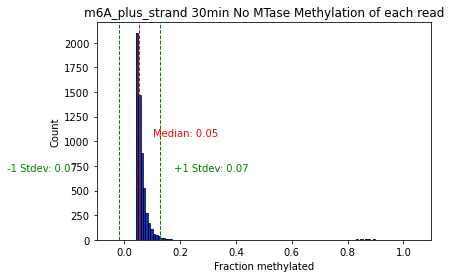

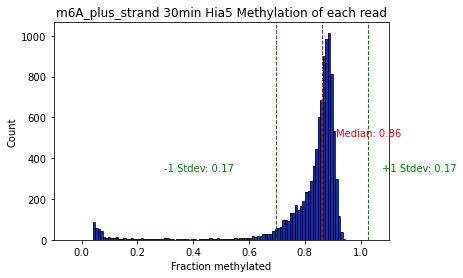

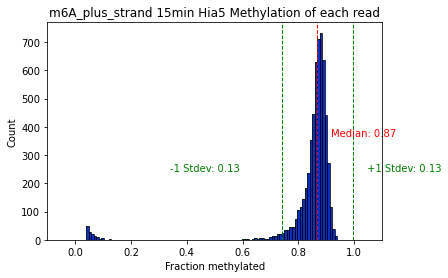

In [114]:
## Plot histogram of read methylation data
adata.uns['methylation_dict'] = {}
n_bins = 100
for dataset in datasets:
    temp_dataset_adata = adata[adata.obs['Dataset'] == dataset]
    for sample in sample_names:
        temp_sample_adata = temp_dataset_adata[temp_dataset_adata.obs['Sample_names'] == sample]
        temp_data = temp_sample_adata.obs['read_mean_methylation']
        timepoint = temp_sample_adata.obs[timepoint_heading][0]
        mtase = temp_sample_adata.obs[mtase_heading][0]
        condition = temp_sample_adata.obs[condition_heading][0]
        median = np.median(temp_data)
        stdev = np.std(temp_data)
        adata.uns['methylation_dict'][f'{dataset}_{sample}'] = (mtase, timepoint, condition, median, stdev)
        # Add a vertical line at the median
        plt.axvline(median, color='red', linestyle='dashed', linewidth=1)
        # Annotate the median
        plt.text(median + 0.05, max(plt.hist(temp_data, bins=n_bins)[0]) / 2, f'Median: {median:.2f}', color='red')
        # Add vertical lines at the standard deviations
        plt.axvline(median - stdev, color='green', linestyle='dashed', linewidth=1, label=f'Stdev: {stdev:.2f}')
        plt.axvline(median + stdev, color='green', linestyle='dashed', linewidth=1)
        # Annotate the standard deviation
        plt.text(median - stdev - 0.4, max(plt.hist(temp_data, bins=n_bins)[0]) / 3, f'-1 Stdev: {stdev:.2f}', color='green')
        plt.text(median + stdev + 0.05, max(plt.hist(temp_data, bins=n_bins)[0]) / 3, f'+1 Stdev: {stdev:.2f}', color='green')
        plt.hist(temp_data, bins=n_bins, alpha=0.7, color='blue', edgecolor='black')
        plt.xlabel('Fraction methylated')
        plt.ylabel('Count')
        plt.title(f'{dataset} {sample} Methylation of each read')
        plt.xlim(-0.1, 1.1)  # Set x-axis range from 0 to 1
        plt.show()


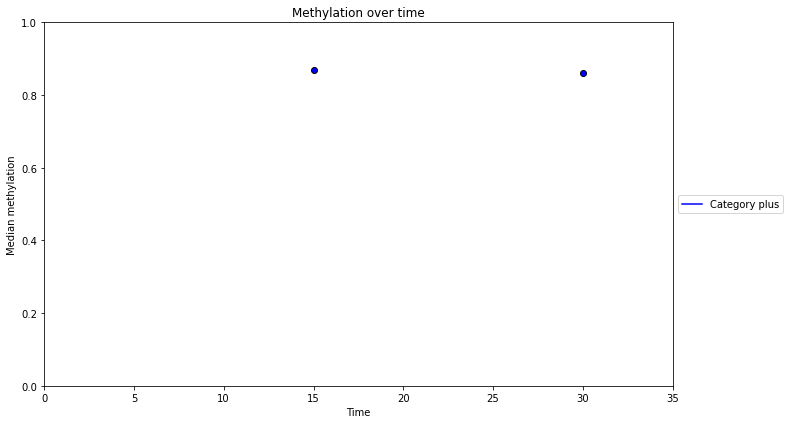

In [112]:
# Plot read methylation medians over time and fit the time curves
from scipy.optimize import curve_fit

mtase_condition = 'Hia5'
samples_to_omit = []
fit_biex = False

# Prepare lists for plotting
time_values = []
methylation_values = []
colors = []
categories = []

# Define a colormap
colormap = {'plus': 'blue', 'minus': 'green'}  # Customize the colors based on your needs

# Iterate through the dictionary and extract the required values
for key, value in adata.uns['methylation_dict'].items():
    if value[0] == mtase_condition and key not in samples_to_omit:
        time_values.append(int(value[1]))
        methylation_values.append(value[3])
        colors.append(colormap[value[2]])
        categories.append(value[2])

# Convert lists to numpy arrays for easier plotting
time_values = np.array(time_values)
methylation_values = np.array(methylation_values)
colors = np.array(colors)
categories = np.array(categories)

# Define the biexponential function
def biexponential_function(x, a1, b1, a2, b2, c):
    return a1 * np.exp(b1 * x) + a2 * np.exp(b2 * x) + c

# Function to calculate R^2
def calculate_r2(y_true, y_pred):
    ss_res = np.sum((y_true - y_pred) ** 2)
    ss_tot = np.sum((y_true - np.mean(y_true)) ** 2)
    return 1 - (ss_res / ss_tot)

# Prepare the plot
plt.figure(figsize=(15, 6))

# Iterate over each category and fit the biexponential function
unique_categories = np.unique(categories)
legend_handles = []

for category in unique_categories:
    cat_mask = categories == category
    x_cat = time_values[cat_mask]
    y_cat = methylation_values[cat_mask]
    
    # Fit the biexponential function to the data for this category
    try:
        if fit_biex:
            params, _ = curve_fit(biexponential_function, x_cat, y_cat, p0=[1, -0.1, 1, -0.01, 1], maxfev=5000)
            # Generate points for the biexponential curve
            x_fit = np.linspace(min(x_cat), max(x_cat), 100)
            y_fit = biexponential_function(x_fit, *params)
            # Calculate R^2
            y_pred = biexponential_function(x_cat, *params)
            r2 = calculate_r2(y_cat, y_pred)
            # Format the equation string
            equation = f'{params[0]:.2f} * exp({params[1]:.2f} * x) + {params[2]:.2f} * exp({params[3]:.2f} * x) + {params[4]:.2f}'
            label = f'Category {category}\nEquation: {equation}\n$R^2$: {r2:.2f}'
            # Plot the biexponential fit for this category
            plt.plot(x_fit, y_fit, color=colormap[category], linewidth=2)
        else:
            label = f'Category {category}'
            
        # Add to legend handles
        legend_handles.append(plt.Line2D([0], [0], color=colormap[category], label=label))   
        # Plot the scatter plot for this category
        plt.scatter(x_cat, y_cat, c=colormap[category], marker='o', edgecolor='black', label=f'Category {category}')

    except RuntimeError as e:
        print(f"Could not fit category {category}: {e}")

# # Add error bars (for demonstration, using random small errors)
# errors = np.random.rand(len(time_values)) * 2  # Random errors for demonstration
# plt.errorbar(time_values, methylation_values, yerr=errors, fmt='o', color='black', ecolor='lightgray', elinewidth=2, capsize=0)

# Add labels and title
plt.xlabel('Time')
plt.ylabel('Median methylation')
plt.title('Methylation over time')

# Add legend for categories and fits
plt.legend(handles=legend_handles, loc='center left', bbox_to_anchor=(1, 0.5))

# Adjust layout to make room for the legend
plt.tight_layout(rect=[0, 0, 0.75, 1])

plt.xlim(0, 35)  # Set x-axis range from 0 to 1
plt.ylim(0, 1)  # Set y-axis range, adjust as needed

# Show the plot
plt.show()

In [79]:
adata.obs

,Sample,Dataset,Sample_names,first_valid_position,last_valid_position,read_length,valid_positions_in_read,invalid_positions_in_read,fraction_valid_positions_in_read,read_methylation_count,read_mean_methylation,sum_between_576_and_583,mean_between_576_and_583,binding_status,TF,Complex,Nucleosomal
770e6271-bee7-4e03-89dc-0d7f5bd3f24a,0,m6A_plus_strand,15min Hia5,1241,4194,2954.0,446,218,0.671687,383.0,0.858744,0.0,0.000000,bound,"[(2410, 11, 0.7893396422520601), (3528, 27, 0....","[(1723, 32, 0.9160116460491197)]",[]
b6bc7f78-6241-4b39-943c-b70be185c300,0,m6A_plus_strand,15min Hia5,1201,4194,2994.0,442,228,0.659701,396.0,0.895928,4.0,0.666667,unbound,"[(1729, 15, 0.7377715937702966), (3718, 16, 0....",[],[]
ce92f4d7-083f-45c0-9529-b0ac2bb93fe3,0,m6A_plus_strand,15min Hia5,1201,4194,2994.0,421,249,0.628358,360.0,0.855107,0.0,0.000000,bound,"[(3697, 26, 0.9390018070809709), (3911, 15, 0....","[(3413, 50, 0.8512994190734229)]",[]
c2878519-2529-48fe-86b6-ad6cd0dae54a,0,m6A_plus_strand,15min Hia5,1201,4188,2988.0,387,282,0.578475,310.0,0.801034,0.0,0.000000,bound,"[(1820, 23, 0.7664632298676424), (2389, 23, 0....","[(1641, 35, 0.8611305208467678)]",[]
fc161cfa-b2e1-4e83-9c49-33d3387bc51e,0,m6A_plus_strand,15min Hia5,1201,4194,2994.0,471,199,0.702985,414.0,0.878981,6.0,1.000000,unbound,"[(1962, 16, 0.8797208584675643)]",[],[]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12612d92-9773-4395-bc00-d925998020a0,6,m6A_plus_strand,30min No MTase,2036,4194,2159.0,371,129,0.742000,15.0,0.040431,1.0,0.142857,unmethylated,[],[],[]
716f1438-064b-45df-b22c-a38b60263ece,6,m6A_plus_strand,30min No MTase,2036,4194,2159.0,351,149,0.702000,15.0,0.042735,0.0,0.000000,unmethylated,[],[],"[(2022, 141, 0.8983896384310357)]"
7a9e24db-2610-455e-b583-1c6584bcda95,6,m6A_plus_strand,30min No MTase,2131,4194,2064.0,335,141,0.703782,19.0,0.056716,2.0,0.285714,unmethylated,[],[],"[(3583, 123, 0.9805548556380095)]"
38e29ff2-34d9-4475-a1c0-c41015814ffe,6,m6A_plus_strand,30min No MTase,2166,4194,2029.0,345,120,0.741935,16.0,0.046377,0.0,0.000000,unmethylated,[],[],"[(2152, 117, 0.902619616332756)]"


In [118]:
### Define and train a HMM using Cython version of pomegranate.
from pomegranate import HiddenMarkovModel, State, DiscreteDistribution

train_model, use_labels, save_model, model_name = [True, True, False, 'trained_HMM']
load_existing_model, existing_model_path = [False, 'trained_HMM.json']

if train_model:
    # define training sets and labels
    training_sets = ['15min Hia5', '30min Hia5', '30min No MTase']
    training_sequence_adatas = adata[adata.obs['Sample_names'].isin(training_sets)]
    # Determine the number of reads to sample
    n_sample = 1000
    # Generate random indices
    np.random.seed(0)
    random_indices = np.random.choice(training_sequence_adatas.shape[0], size=n_sample, replace=False)
    # Subset the AnnData object using the random indices
    training_adata_subsampled = training_sequence_adatas[random_indices, :]
    training_sequences = training_adata_subsampled.X
    if use_labels:
        labels = training_adata_subsampled.layers['label_layer']

    # Initialize a pomegranate HMM
    model = HiddenMarkovModel(name="Methylation HMM")

    # States
    non_methylated = State(DiscreteDistribution({0: 0.95, 1: 0.05}), name="Non-Methylated")
    methylated = State(DiscreteDistribution({0: 0.05, 1: 0.95}), name="Methylated")

    # Add states to the model
    model.add_states(non_methylated, methylated)

    # Transitions
    model.add_transition(model.start, non_methylated, 0.5)
    model.add_transition(model.start, methylated, 0.5)
    model.add_transition(non_methylated, non_methylated, 0.98)
    model.add_transition(non_methylated, methylated, 0.02)
    model.add_transition(methylated, non_methylated, 0.02)
    model.add_transition(methylated, methylated, 0.98)
    model.add_transition(non_methylated, model.end, 0.5)
    model.add_transition(methylated, model.end, 0.5)

    # Build graph
    model.bake()

    if use_labels:
        # Train the HMM with labeled data
        model.fit(training_sequences, labels=labels)
        training_algorithm = 'supervised'
    else:
        # Train the HMM without labeled data
        model.fit(training_sequences, algorithm='baum-welch')
        training_algorithm = 'baum_welch'
    
    if save_model:
        # Save the model to a file
        model_json = model.to_json()
        with open(f'{model_name}_{training_algorithm}.json', 'w') as f:
            f.write(model_json)

if load_existing_model:
    with open(existing_model_path, 'r') as f:
        model_json = f.read()

    model = HiddenMarkovModel.from_json(model_json)

In [119]:
# Print the updated transition matrix and emission probabilities
print("Transition matrix:")
print(model.dense_transition_matrix())
print("\nEmission probabilities:")
for state in model.states:
    if isinstance(state.distribution, DiscreteDistribution):
        print(state.name, state.distribution.parameters)

Transition matrix:
[[0.99209092 0.00638491 0.         0.00152417]
 [0.01333759 0.98523562 0.         0.00142679]
 [0.67527083 0.32472917 0.         0.        ]
 [0.         0.         0.         0.        ]]

Emission probabilities:
Methylated [{0: 0.11799042464153223, 1: 0.8820095753584665}]
Non-Methylated [{0: 0.9561965579094281, 1: 0.04380344209057137}]


In [120]:
# Uses HMM to calls TFs, complexes, and nucleosome footprints
# Initialize columns for classifications
adata.obs['TF'] = [[] for _ in range(adata.shape[0])]
adata.obs['Complex'] = [[] for _ in range(adata.shape[0])]
adata.obs['Nucleosomal'] = [[] for _ in range(adata.shape[0])]
# Apply the HMM and add the classifications to the observation metadata.
for i, read in enumerate(adata.X):
    index = adata.obs.index[i]
    classifications = classify_non_methylated_features(read, model, adata.var_names)
    for start, length, classification, prob in classifications:
        adata.obs.at[index, classification].append((start, length, prob))

In [121]:
adata.obs

,Sample,Dataset,Sample_names,first_valid_position,last_valid_position,read_length,valid_positions_in_read,invalid_positions_in_read,fraction_valid_positions_in_read,read_methylation_count,read_mean_methylation,sum_between_576_and_583,mean_between_576_and_583,binding_status,TF,Complex,Nucleosomal,timepoint_min,MTase,dCas9_status
770e6271-bee7-4e03-89dc-0d7f5bd3f24a,0,m6A_plus_strand,15min Hia5,1241,4194,2954.0,446,218,0.671687,383.0,0.858744,0.0,0.000000,bound,"[(3528, 25, 0.6898158600791854), (3698, 25, 0....","[(1723, 32, 0.899148286707401)]",[],15,Hia5,plus
b6bc7f78-6241-4b39-943c-b70be185c300,0,m6A_plus_strand,15min Hia5,1201,4194,2994.0,442,228,0.659701,396.0,0.895928,4.0,0.666667,unbound,[],[],[],15,Hia5,plus
ce92f4d7-083f-45c0-9529-b0ac2bb93fe3,0,m6A_plus_strand,15min Hia5,1201,4194,2994.0,421,249,0.628358,360.0,0.855107,0.0,0.000000,bound,"[(3697, 26, 0.9407610952169968)]","[(3413, 50, 0.8827315798537655)]",[],15,Hia5,plus
c2878519-2529-48fe-86b6-ad6cd0dae54a,0,m6A_plus_strand,15min Hia5,1201,4188,2988.0,387,282,0.578475,310.0,0.801034,0.0,0.000000,bound,"[(2389, 23, 0.8546359335865681)]","[(1641, 35, 0.5570099384263016)]",[],15,Hia5,plus
fc161cfa-b2e1-4e83-9c49-33d3387bc51e,0,m6A_plus_strand,15min Hia5,1201,4194,2994.0,471,199,0.702985,414.0,0.878981,6.0,1.000000,unbound,"[(1962, 11, 0.6939286114965586)]",[],[],15,Hia5,plus
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12612d92-9773-4395-bc00-d925998020a0,6,m6A_plus_strand,30min No MTase,2036,4194,2159.0,371,129,0.742000,15.0,0.040431,1.0,0.142857,unmethylated,[],[],[],30,No MTase,plus
716f1438-064b-45df-b22c-a38b60263ece,6,m6A_plus_strand,30min No MTase,2036,4194,2159.0,351,149,0.702000,15.0,0.042735,0.0,0.000000,unmethylated,[],[],[],30,No MTase,plus
7a9e24db-2610-455e-b583-1c6584bcda95,6,m6A_plus_strand,30min No MTase,2131,4194,2064.0,335,141,0.703782,19.0,0.056716,2.0,0.285714,unmethylated,[],[],[],30,No MTase,plus
38e29ff2-34d9-4475-a1c0-c41015814ffe,6,m6A_plus_strand,30min No MTase,2166,4194,2029.0,345,120,0.741935,16.0,0.046377,0.0,0.000000,unmethylated,[],[],[],30,No MTase,plus


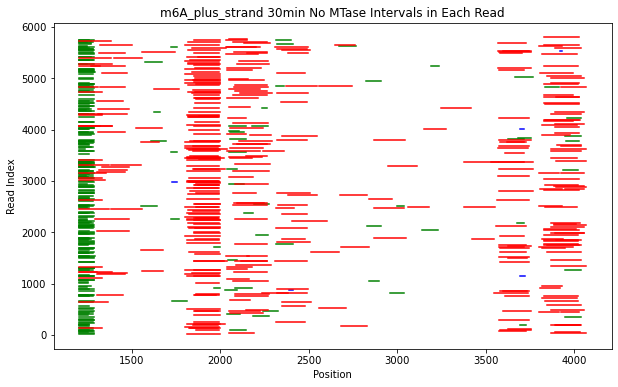

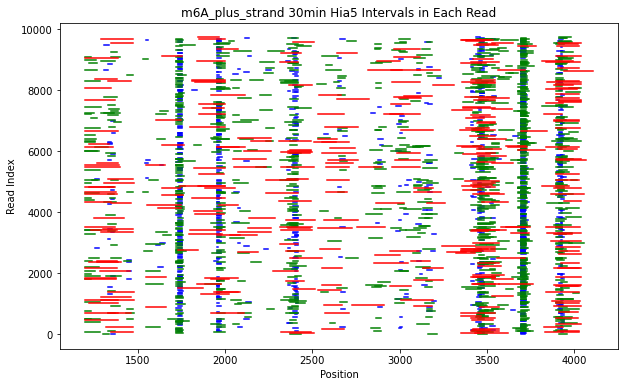

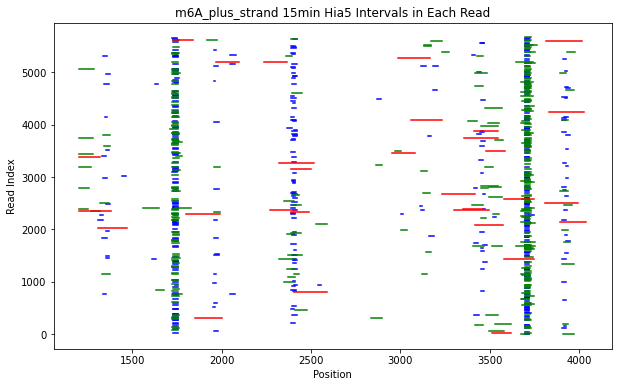

In [122]:
## Plotting HMM features
feature_threshold = 0.96
for dataset in datasets:
    temp_adata = adata[adata.obs['Dataset'] == str(dataset)]
    for sample in sample_names:
        sample_adata = temp_adata[temp_adata.obs['Sample_names'] == str(sample)]
        plt.figure(figsize=(10, 6))
        
        # Plot the TF intervals
        for i, tf_intervals in enumerate(sample_adata.obs['TF']):
            for start, length, prob in tf_intervals:
                if prob > feature_threshold:
                    plt.plot(range(start, start + length), [i + 1] * length, color='blue', label='TF' if i == 0 else "")

        # Plot Complex intervals in green
        for i, complex_intervals in enumerate(sample_adata.obs['Complex']):
            for start, length, prob in complex_intervals:
                if prob > feature_threshold:
                    plt.plot(range(start, start + length), [i + 1] * length, color='green', label='Complex' if i == 0 else "")

        # Plot Nucleosomal intervals in red
        for i, nucleosomal_intervals in enumerate(sample_adata.obs['Nucleosomal']):
            for start, length, prob in nucleosomal_intervals:
                if prob > feature_threshold:
                    plt.plot(range(start, start + length), [i + 1] * length, color='red', label='Nucleosomal' if i == 0 else "")

        plt.xlabel('Position')
        plt.ylabel('Read Index')
        plt.title(f'{dataset} {sample} Intervals in Each Read')
        plt.show()

14:50:53: sorting data for sample 30min No MTase
14:50:53: Plotting the sorted SMF data


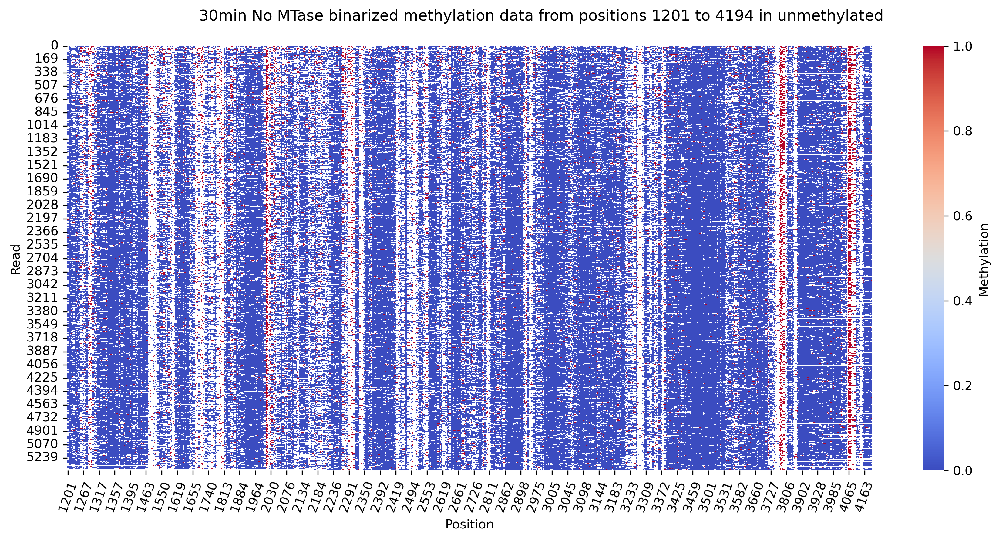

14:50:55: sorting data for sample 30min Hia5
14:50:55: Plotting the sorted SMF data


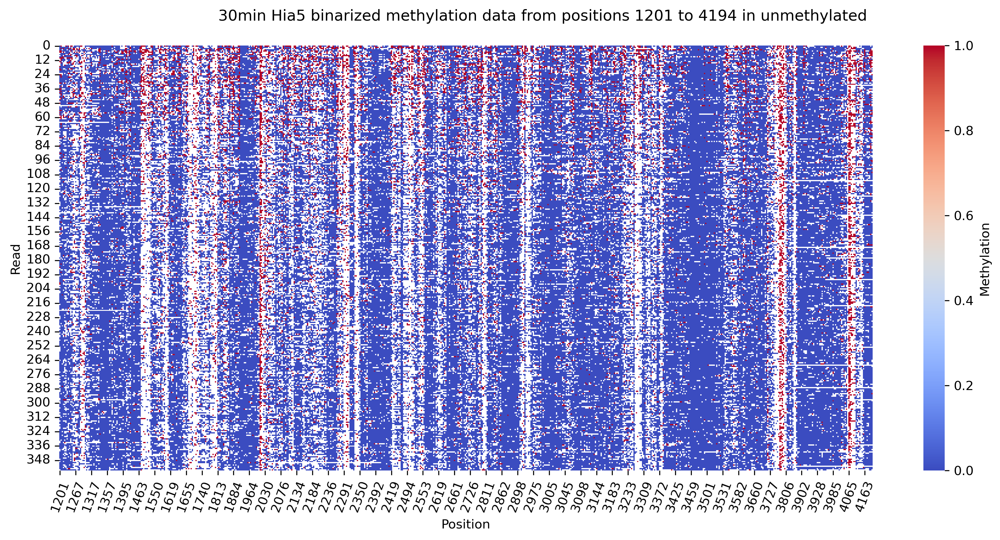

14:50:56: sorting data for sample 15min Hia5
14:50:56: Plotting the sorted SMF data


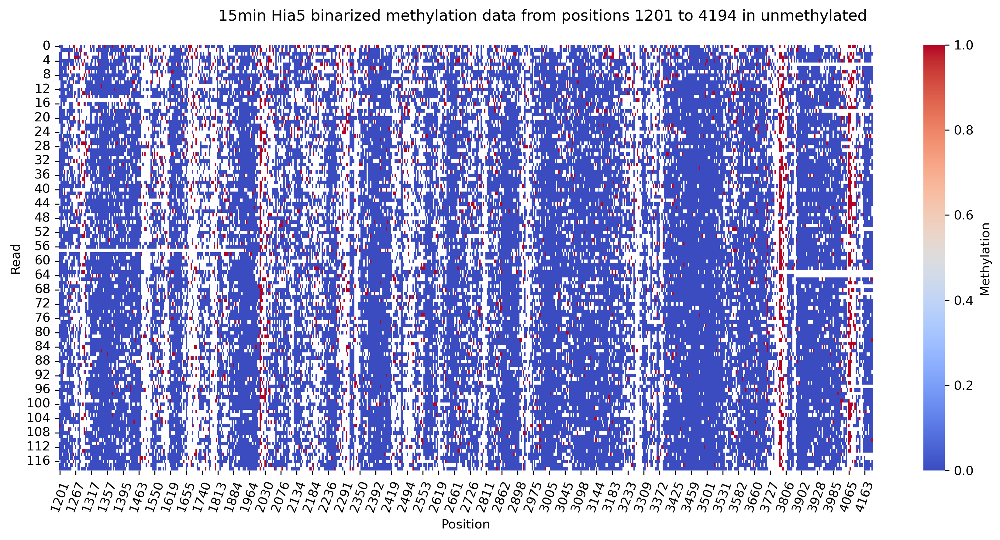

14:50:57: sorting data for sample 30min No MTase
14:50:57: Plotting the sorted SMF data


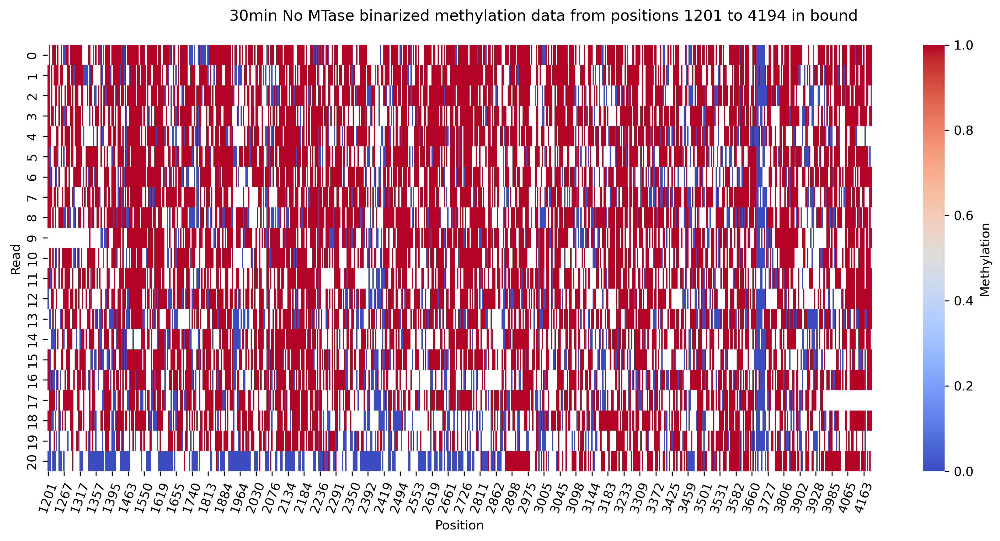

14:50:57: sorting data for sample 30min Hia5
14:50:57: Plotting the sorted SMF data


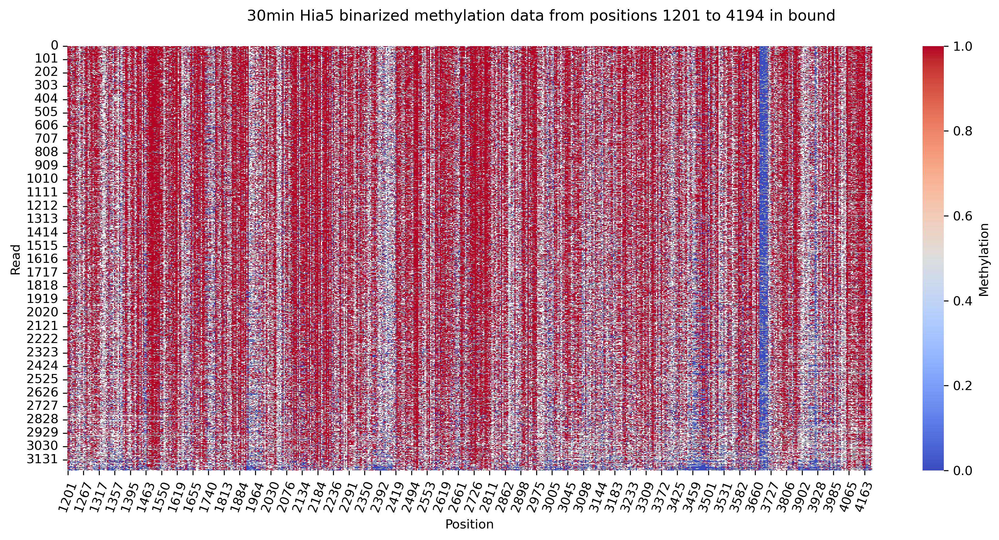

14:50:59: sorting data for sample 15min Hia5
14:50:59: Plotting the sorted SMF data


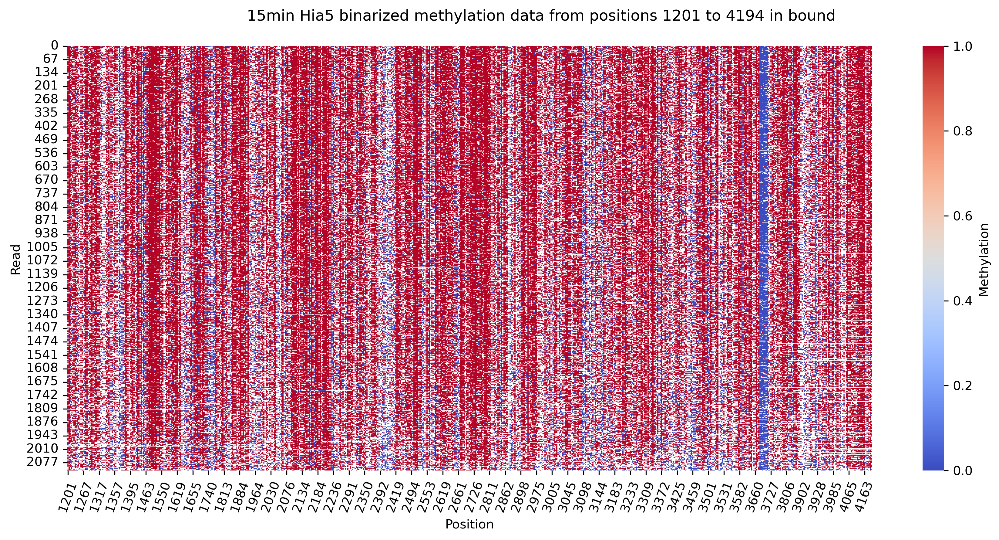

14:51:01: sorting data for sample 30min No MTase
14:51:01: Plotting the sorted SMF data


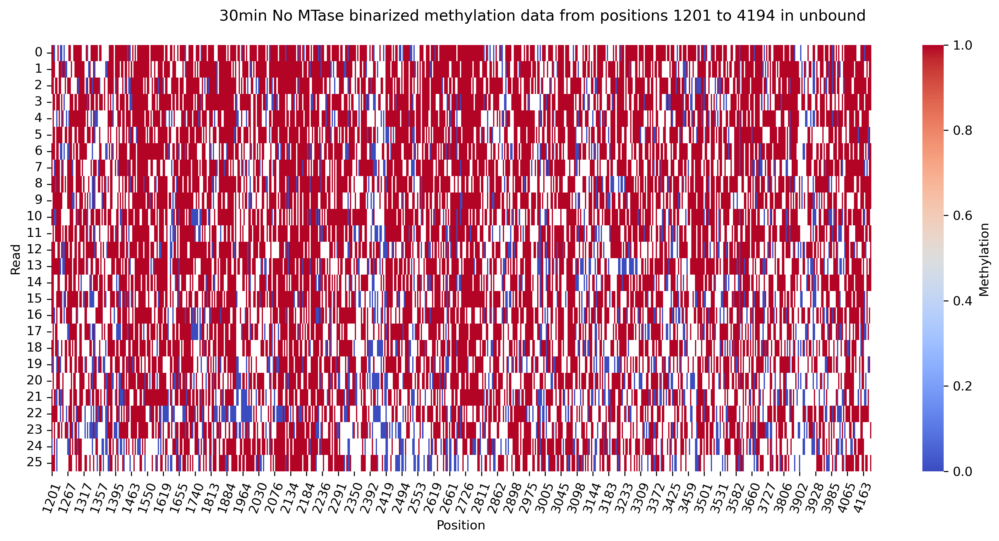

14:51:02: sorting data for sample 30min Hia5
14:51:02: Plotting the sorted SMF data


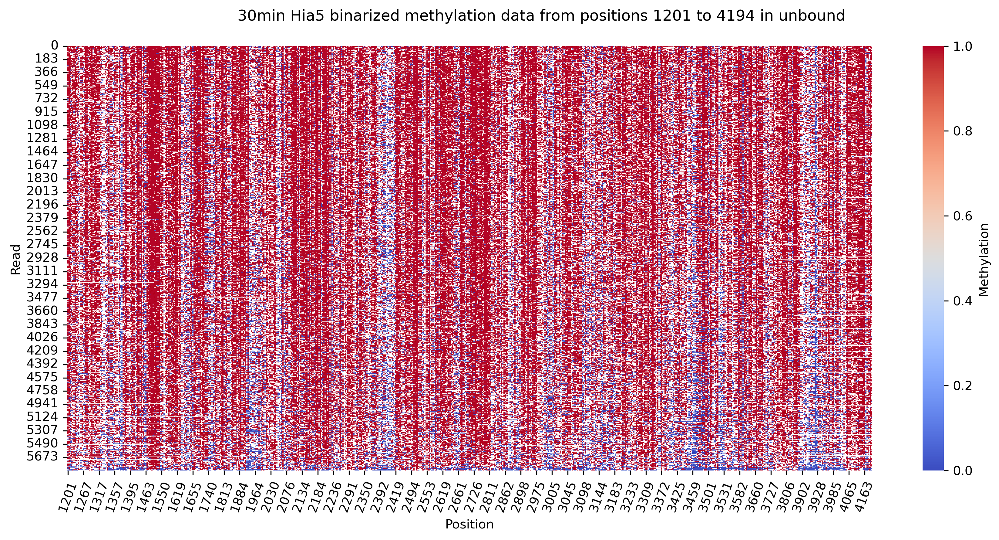

14:51:05: sorting data for sample 15min Hia5
14:51:05: Plotting the sorted SMF data


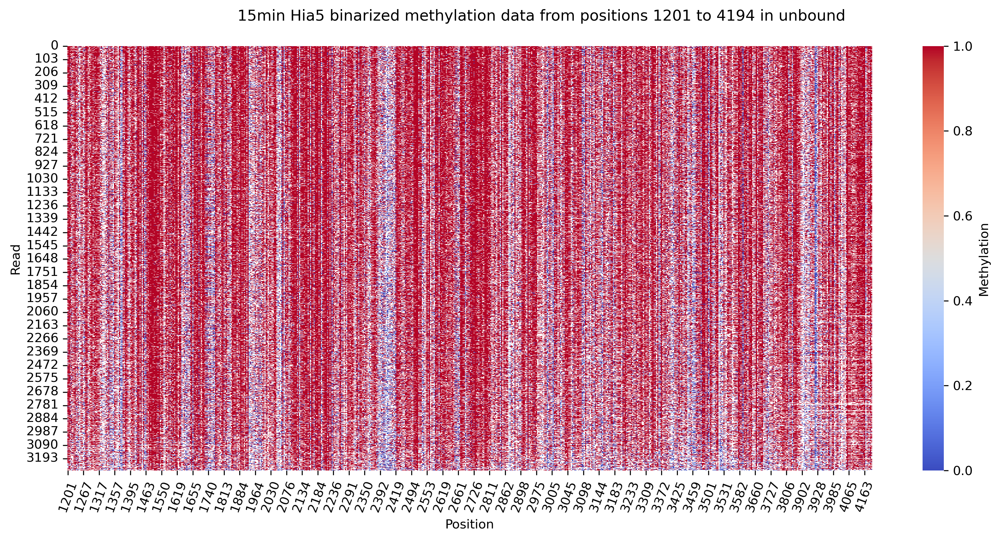

14:51:06: sorting data for sample 30min No MTase
14:51:06: Plotting the sorted SMF data


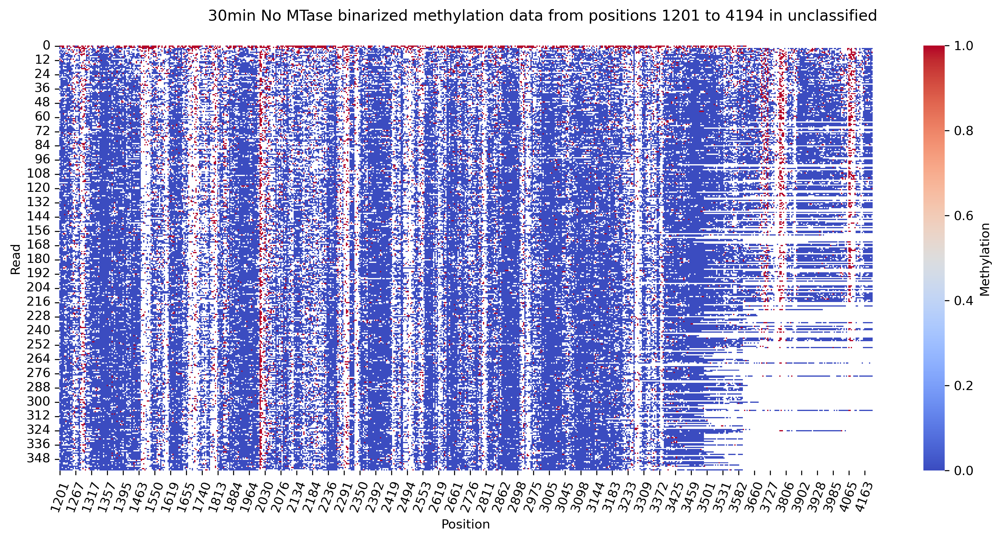

14:51:07: sorting data for sample 30min Hia5
14:51:07: Plotting the sorted SMF data


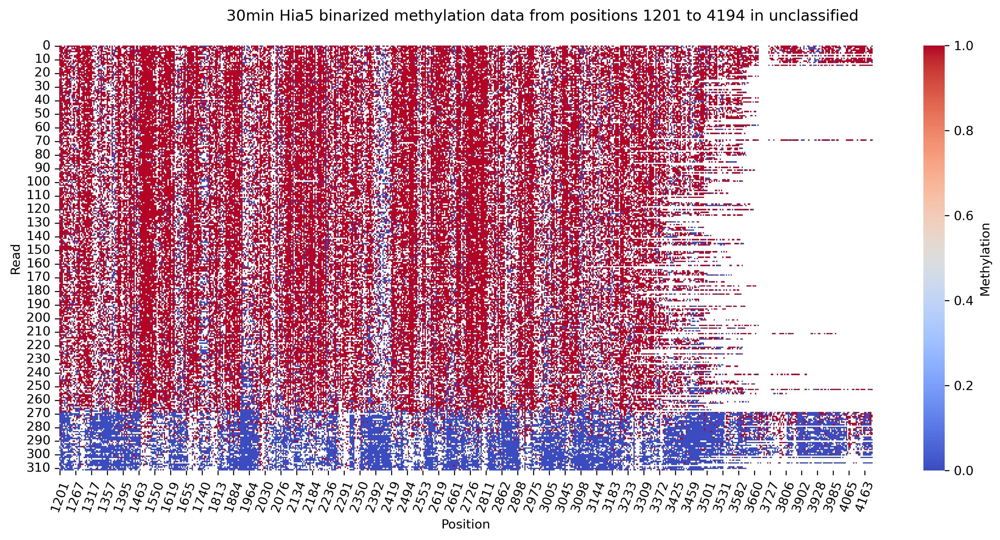

14:51:08: sorting data for sample 15min Hia5
14:51:08: Plotting the sorted SMF data


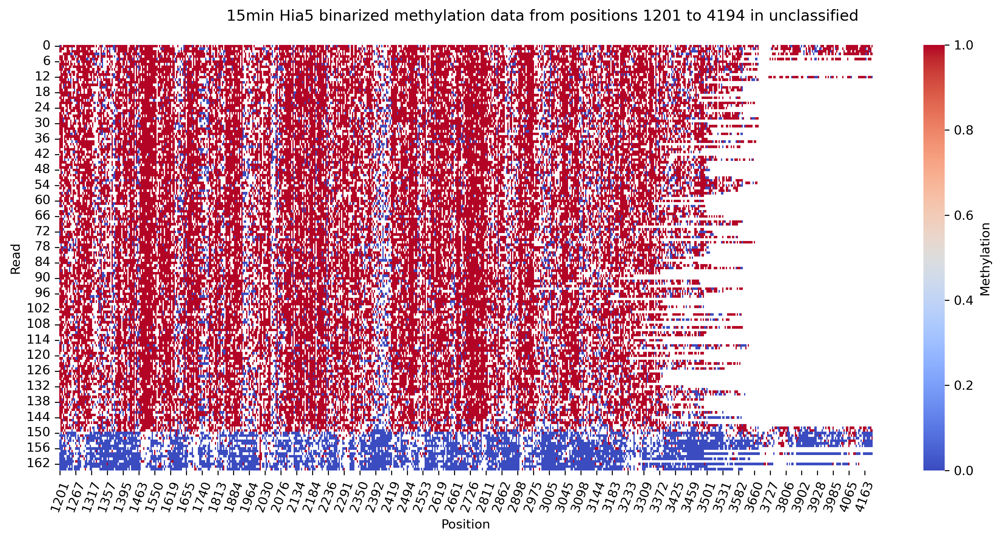

In [117]:
# Plotting a basic Read by position methylation heatmap that is sorted by read sum methylation intensity ##

## Parameters ##
show_basic_plot = True
save_basic_plot = False
pallet = 'coolwarm'
condition_set, condition_obs_name =[binding_states, 'binding_status']
#################

if show_basic_plot:
    for condition in condition_set:
        temp_condition_adata = adata[adata.obs[condition_obs_name] == str(condition)]
        for j, sample in enumerate(sample_names):
            print('{0}: sorting data for sample {1}'.format(time_string(), sample))
            temp_adata_subset = temp_condition_adata[temp_condition_adata.obs['Sample_names'] == str(sample)]
            df = adata_to_df(temp_adata_subset)
            df['row_sum'] = df.sum(axis=1)
            # Sort the DataFrame by the row sums in descending order
            df_sorted = df.sort_values(by='row_sum', ascending=False)
            # Drop the temporary 'row_sum' column
            df_sorted = df_sorted.drop(columns=['row_sum'])
            df_sorted = df_sorted.reset_index(drop=True)
            # Create heatmap
            title = f'{sample} binarized methylation data from positions {lower_bound} to {upper_bound} in {condition}'
            cmap = pallet
            xlabel = 'Position'
            ylabel = 'Read'
            colorbar_label = 'Methylation'
            save_name = cwd + f'/{date_string} sorted binarized methylation data for {sample} {condition} {lower_bound}_{upper_bound}'
            print('{0}: Plotting the sorted SMF data'.format(time_string()))
            pair_heatmap_plot(df_sorted, title, xlabel, ylabel, save_basic_plot, save_name, cmap, colorbar_label)

In [115]:
adata.obs

,Sample,Dataset,Sample_names,first_valid_position,last_valid_position,read_length,valid_positions_in_read,invalid_positions_in_read,fraction_valid_positions_in_read,read_methylation_count,read_mean_methylation,sum_between_576_and_583,mean_between_576_and_583,binding_status,TF,Complex,Nucleosomal,timepoint_min,MTase,dCas9_status
770e6271-bee7-4e03-89dc-0d7f5bd3f24a,0,m6A_plus_strand,15min Hia5,1241,4194,2954.0,446,218,0.671687,383.0,0.858744,0.0,0.000000,bound,"[(3528, 25, 0.711987197348831), (3698, 25, 0.7...","[(1723, 32, 0.9019317679174387)]",[],15,Hia5,plus
b6bc7f78-6241-4b39-943c-b70be185c300,0,m6A_plus_strand,15min Hia5,1201,4194,2994.0,442,228,0.659701,396.0,0.895928,4.0,0.666667,unbound,[],[],[],15,Hia5,plus
ce92f4d7-083f-45c0-9529-b0ac2bb93fe3,0,m6A_plus_strand,15min Hia5,1201,4194,2994.0,421,249,0.628358,360.0,0.855107,0.0,0.000000,bound,"[(3697, 26, 0.9412072349508592), (3914, 11, 0....","[(3413, 50, 0.8856094931125178)]",[],15,Hia5,plus
c2878519-2529-48fe-86b6-ad6cd0dae54a,0,m6A_plus_strand,15min Hia5,1201,4188,2988.0,387,282,0.578475,310.0,0.801034,0.0,0.000000,bound,"[(2389, 23, 0.8640501529368765)]","[(1641, 35, 0.5837550976090276)]",[],15,Hia5,plus
fc161cfa-b2e1-4e83-9c49-33d3387bc51e,0,m6A_plus_strand,15min Hia5,1201,4194,2994.0,471,199,0.702985,414.0,0.878981,6.0,1.000000,unbound,"[(1962, 11, 0.7182864595467544)]",[],[],15,Hia5,plus
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12612d92-9773-4395-bc00-d925998020a0,6,m6A_plus_strand,30min No MTase,2036,4194,2159.0,371,129,0.742000,15.0,0.040431,1.0,0.142857,unmethylated,[],[],[],30,No MTase,plus
716f1438-064b-45df-b22c-a38b60263ece,6,m6A_plus_strand,30min No MTase,2036,4194,2159.0,351,149,0.702000,15.0,0.042735,0.0,0.000000,unmethylated,[],[],[],30,No MTase,plus
7a9e24db-2610-455e-b583-1c6584bcda95,6,m6A_plus_strand,30min No MTase,2131,4194,2064.0,335,141,0.703782,19.0,0.056716,2.0,0.285714,unmethylated,[],[],[],30,No MTase,plus
38e29ff2-34d9-4475-a1c0-c41015814ffe,6,m6A_plus_strand,30min No MTase,2166,4194,2029.0,345,120,0.741935,16.0,0.046377,0.0,0.000000,unmethylated,[],[],[],30,No MTase,plus


14:27:00: Calculating kmeans clustering of adata_subset for 3 clusters
14:27:00: sorting m6A_plus_strand data for sample 30min Hia5
14:27:00: Sorting data on kmeans_labels_reordered observation
14:27:00: Plotting the k-means cluster sorted SMF data


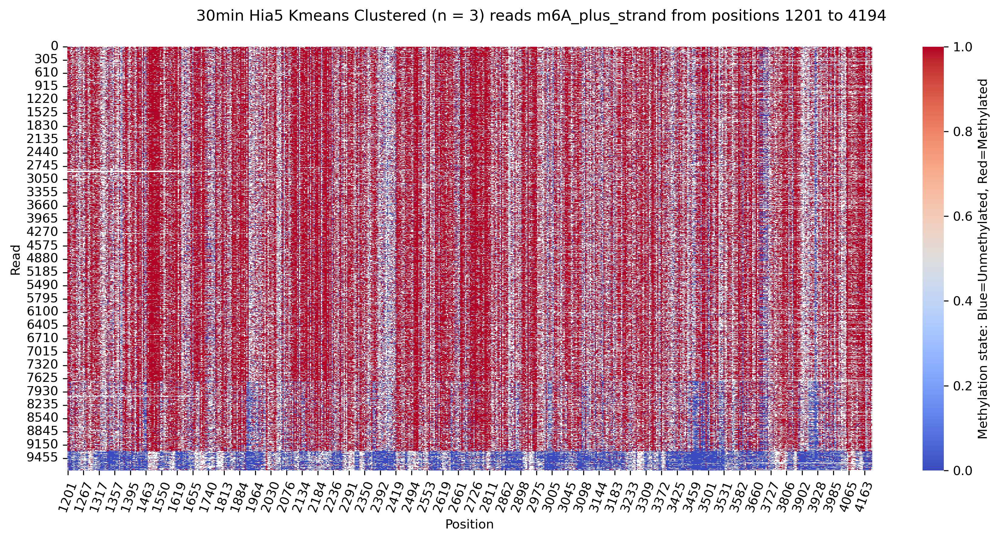

14:27:05: sorting m6A_plus_strand data for sample 30min No MTase
14:27:05: Sorting data on kmeans_labels_reordered observation
14:27:05: Plotting the k-means cluster sorted SMF data


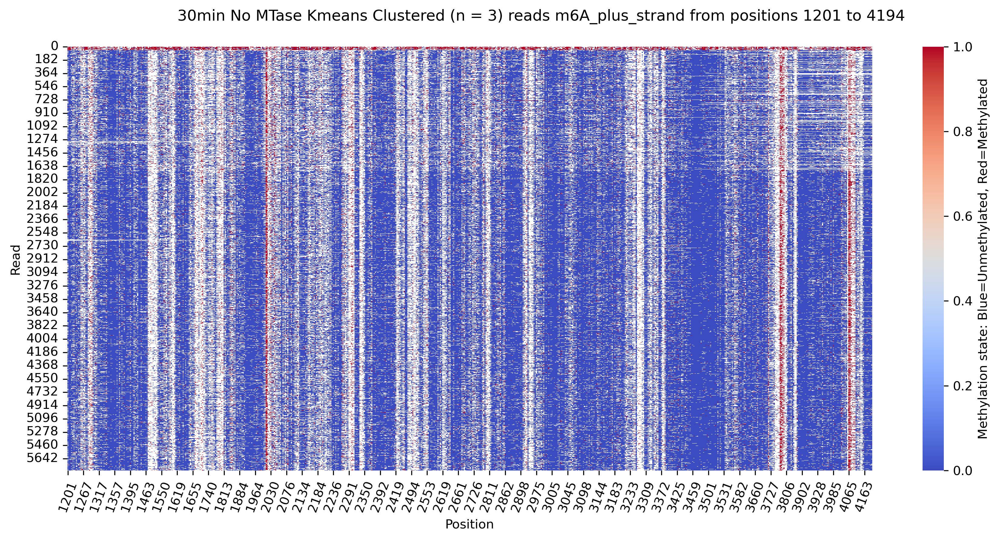

14:27:08: sorting m6A_plus_strand data for sample 15min Hia5
14:27:08: Sorting data on kmeans_labels_reordered observation
14:27:08: Plotting the k-means cluster sorted SMF data


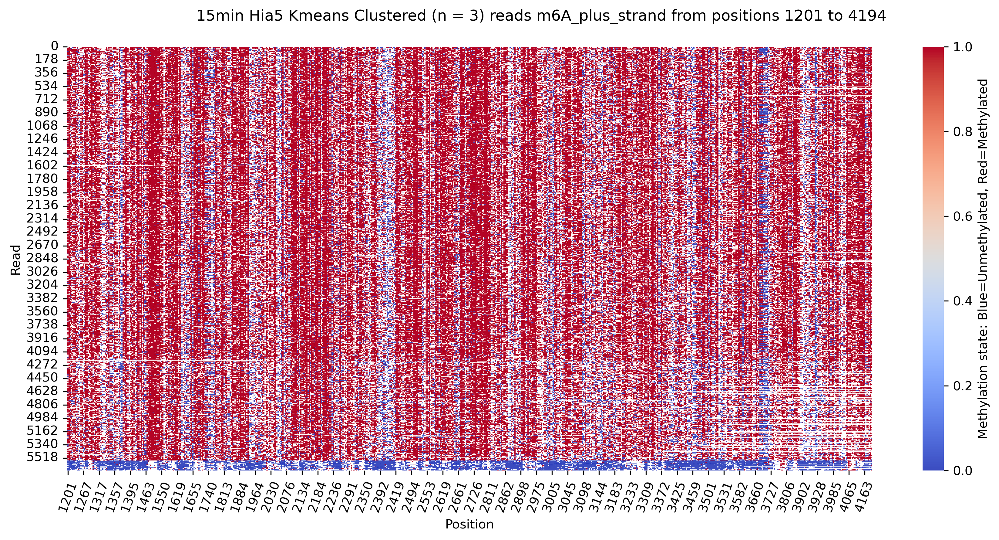

In [30]:
## Plotting a k means clustered Read by position methylation heatmap that is sorted by read sum methylation intensity ##

## Parameters ##
n_kmeans_clusters = 2
layer = 'nan0_0minus1'
show_kmeans_plot = True
save_kmeans_plot = False
pallet = 'coolwarm'
#################

if show_kmeans_plot:
    from sklearn.cluster import KMeans
    # Create a KMeans object with the desired number of clusters
    print('{0}: Calculating kmeans clustering of adata_subset for {1} clusters'.format(time_string(), n_kmeans_clusters))
    kmeans = KMeans(n_clusters=n_kmeans_clusters)
    for dataset in datasets:
        temp_dataset_adata = adata[adata.obs['Dataset'] == str(dataset)].copy()
        for j, sample in enumerate(sample_names):
            print('{0}: sorting {1} data for sample {2}'.format(time_string(), dataset, sample))
            sample_adata = temp_dataset_adata[temp_dataset_adata.obs['Sample_names'] == str(sample)].copy()    
            # Fit the KMeans model to the data
            kmeans.fit(sample_adata.layers[layer])
            # Get the cluster labels for each data point
            cluster_labels = kmeans.labels_
            # Add the kmeans cluster data as an observation to the anndata object
            sample_adata.obs['kmeans_labels'] = cluster_labels.astype(str)
            # Calculate the mean of each observation categoty of each cluster
            cluster_means = sample_adata.obs.groupby('kmeans_labels').mean()
            # Sort the cluster indices by mean methylation value
            sorted_clusters = cluster_means.sort_values(by='read_mean_methylation', ascending=False).index
            # Create a mapping of the old cluster values to the new cluster values
            sorted_cluster_mapping = {old: new for new, old in enumerate(sorted_clusters)}
            # Apply the mapping to create a new observation value: kmeans_labels_reordered
            sample_adata.obs['kmeans_labels_reordered'] = sample_adata.obs['kmeans_labels'].map(sorted_cluster_mapping)
            sample_adata.obs['kmeans_labels_reordered'] = sample_adata.obs['kmeans_labels_reordered'].astype(int)
            # Sort the adata_subset object by the kmeans_labels_reordered observation
            print('{0}: Sorting data on kmeans_labels_reordered observation'.format(time_string()))
            sorted_indices = sample_adata.obs.sort_values(by='kmeans_labels_reordered').index
            sample_adata = sample_adata[sorted_indices].copy()
            #adata_subset.obs = adata_subset.obs.sort_values(by='kmeans_labels_reordered')
            df = adata_to_df(sample_adata)
            df = df.reset_index(drop=True)
            # Create heatmap
            title = '{0} Kmeans Clustered (n = {1}) reads {2} from positions {3} to {4}'.format(sample, n_kmeans_clusters ,dataset, lower_bound, upper_bound)
            cmap = 'coolwarm'  #'Blues'
            xlabel = 'Position'
            ylabel = 'Read'
            colorbar_label = 'Methylation state: Blue=Unmethylated, Red=Methylated'
            save_name = cwd + '/{0}_{1}_{2} clustered binarized methylation data for {3} {4}_{5}'.format(date_string, time_string(sep=''), sample, dataset, lower_bound, upper_bound)
            print('{0}: Plotting the k-means cluster sorted SMF data'.format(time_string()))
            pair_heatmap_plot(df, title, xlabel, ylabel, save_kmeans_plot, save_name, cmap, colorbar_label)

14:29:43: sorting m6A_plus_strand data for sample 30min Hia5


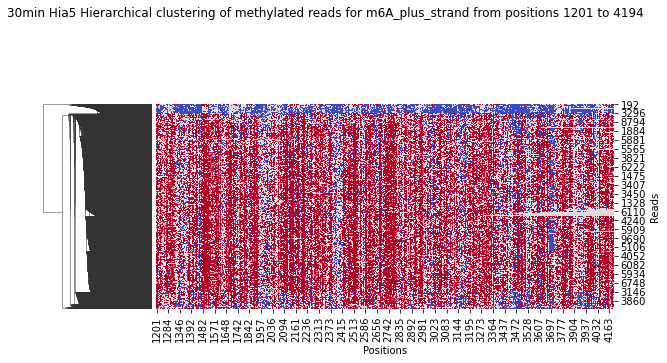

14:30:09: sorting m6A_plus_strand data for sample 30min No MTase


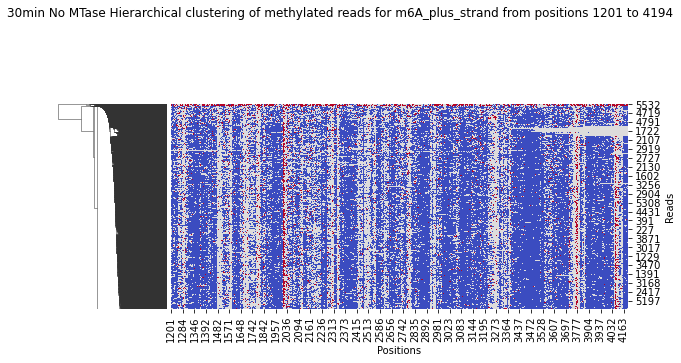

14:30:21: sorting m6A_plus_strand data for sample 15min Hia5


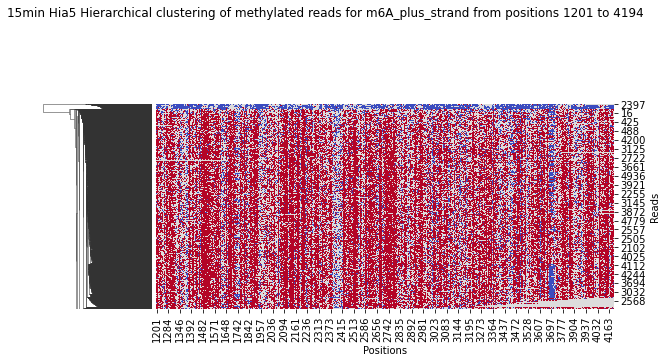

In [32]:
## Plotting a Hierarchical clustered Read by position methylation heatmap ##

## Parameters ##
show_hierchical_plot = True 
save_hierarchical_plot = False
layer = 'nan0_0minus1'
pallet = 'coolwarm'
#################

if show_hierchical_plot:
    from scipy.cluster.hierarchy import linkage, dendrogram
    for dataset in datasets:
        temp_dataset_adata = adata[adata.obs['Dataset'] == str(dataset)].copy()
        for j, sample in enumerate(sample_names):
            print('{0}: sorting {1} data for sample {2}'.format(time_string(), dataset, sample))
            sample_adata = temp_dataset_adata[temp_dataset_adata.obs['Sample_names'] == str(sample)].copy() 
            df = adata_to_df(sample_adata, layer=layer)
            df = df.reset_index(drop=True)
            clustergrid = sns.clustermap(df, cmap=pallet, method='average', metric='euclidean', row_cluster=True, col_cluster=False, figsize=(10, 6), cbar=(False))
            clustergrid.fig.suptitle('{0} Hierarchical clustering of methylated reads for {1} from positions {2} to {3}'.format(sample, dataset, lower_bound, upper_bound), y=0.9)
            clustergrid.ax_heatmap.set_xlabel('Positions')
            clustergrid.ax_heatmap.set_ylabel('Reads')
            plt.subplots_adjust(left=0.1, right=0.9, top=0.8, bottom=0.2)   
            if clustergrid.cax is not None:
                clustergrid.cax.set_visible(False)         
            if save_hierarchical_plot:
                save_name=cwd + '/{0}_{1} Hierarchical heatmap for {2} {3}_{4}'.format(date_string, sample,  dataset, lower_bound, upper_bound)
                clustergrid.savefig(save_name, bbox_inches='tight', pad_inches=0.1)
            else:
                plt.show()

14:31:14: sorting m6A_plus_strand data for sample 30min Hia5
14:31:14: Calculating combination matrix


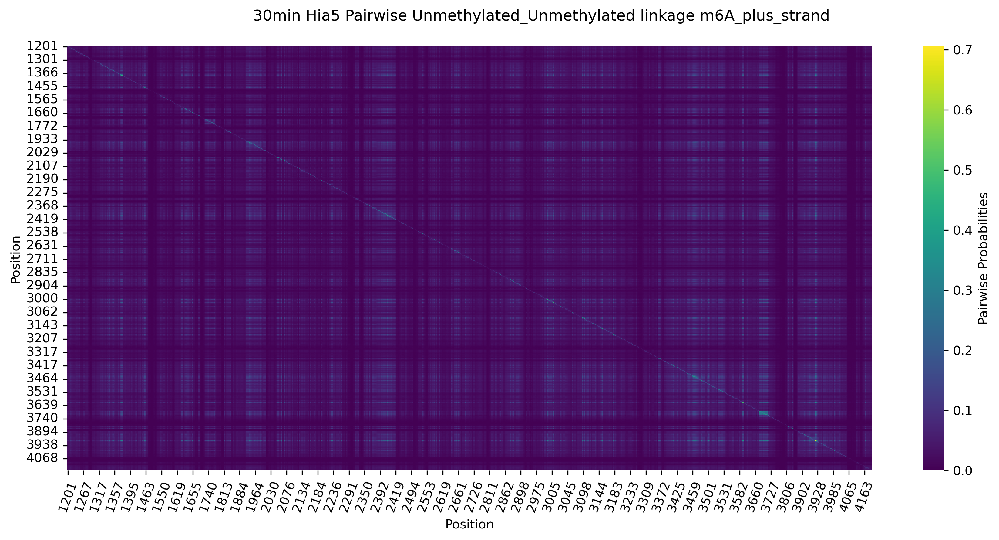

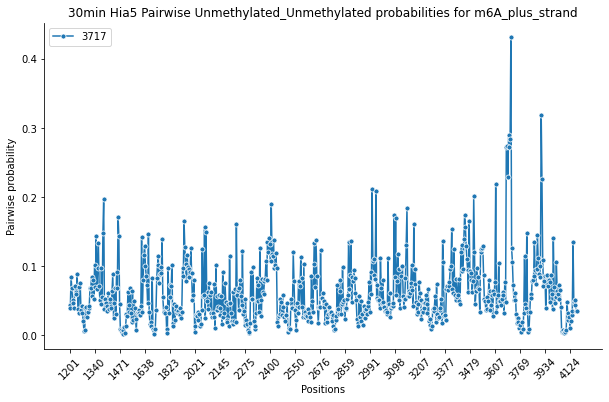

14:31:50: sorting m6A_plus_strand data for sample 30min No MTase
14:31:51: Calculating combination matrix


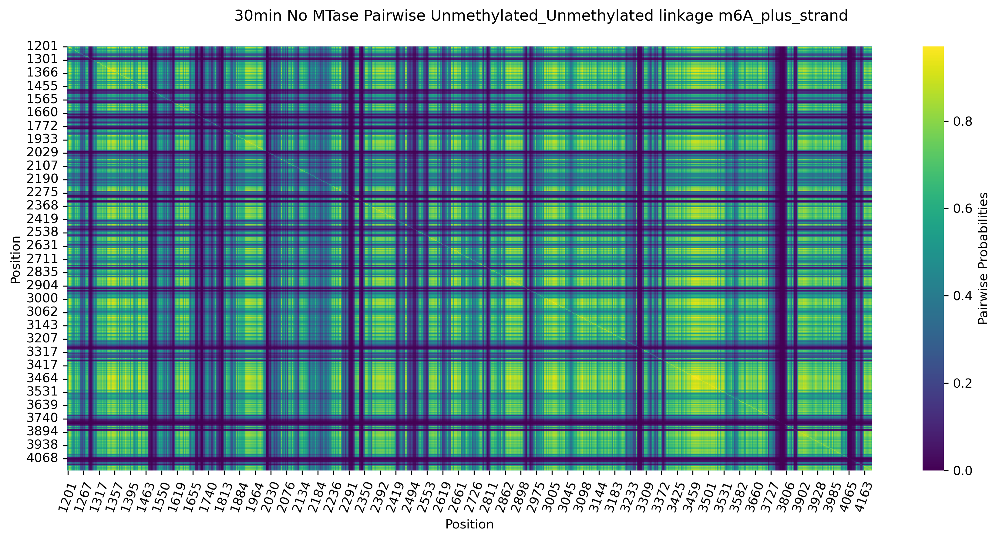

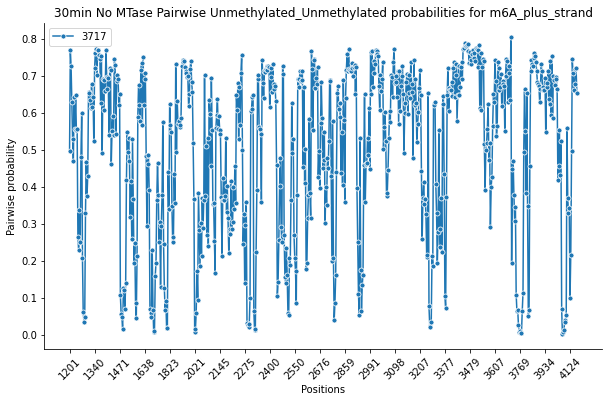

14:32:21: sorting m6A_plus_strand data for sample 15min Hia5
14:32:21: Calculating combination matrix


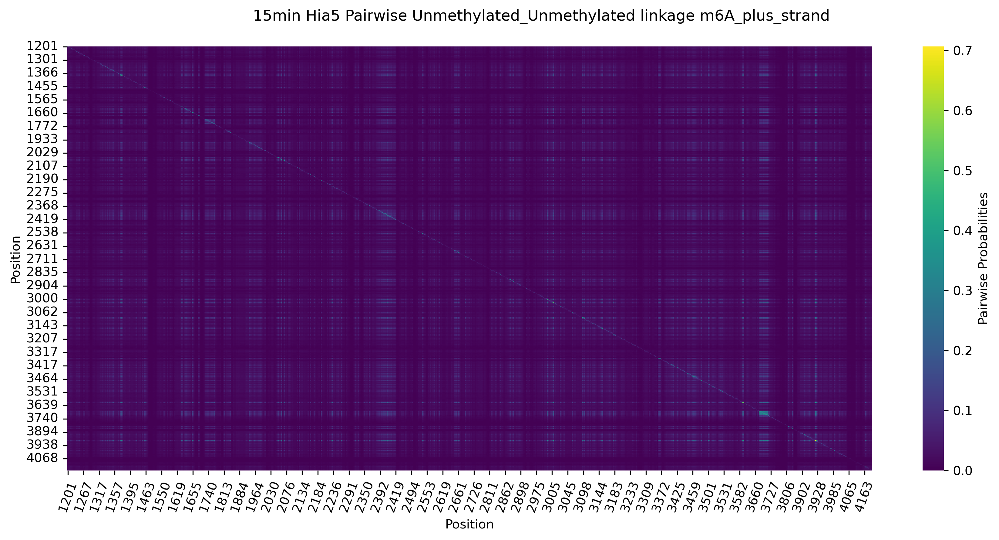

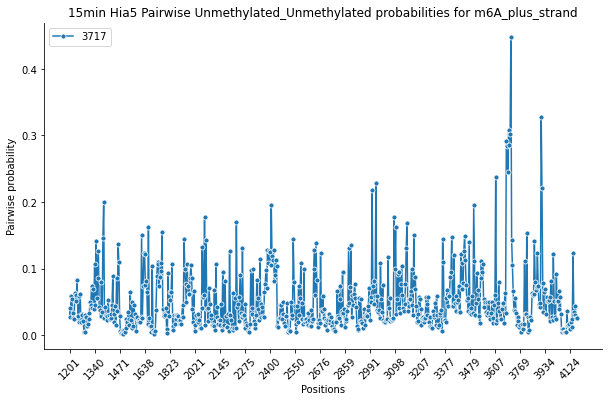

In [33]:
## Plotting Combinations heatmap of position by position for a specific pairwise methlation state ##

## Parameters ##
# pairwise_vmax_value = 1.1 # Maximal pairwise value to use in the pairwise heatmap colorbar
show_pairwise_combinations_plot = True
save_pairwise_combinations_plot = False
plot_pairwise_single_position = True
pairwise_positions_to_plot = ['3717']
save_pairwise_single_position = False
interaction= ['1-1','1-0','0-1','0-0'] # Pairwise combination interactions
pairwise_combinations = 3 # Index of the pairwise combination to analyze
pallet = 'viridis'
#################

if show_pairwise_combinations_plot:
    for dataset in datasets:
        temp_dataset_adata = adata[adata.obs['Dataset'] == str(dataset)].copy()
        for j, sample in enumerate(sample_names):
            print('{0}: sorting {1} data for sample {2}'.format(time_string(), dataset, sample))
            sample_adata = temp_dataset_adata[temp_dataset_adata.obs['Sample_names'] == str(sample)].copy() 
            df = adata_to_df(sample_adata)
            df = df.reset_index(drop=True)
            result_matrix = calculate_combinations_matrix_numpy(df)
            result_matrix_single = result_matrix[:,:,pairwise_combinations]
            result_df = pd.DataFrame(result_matrix_single)
            result_df.columns = df.columns
            result_df = result_df.set_index(df.columns)
            interaction_II = ['Methylated_Methylated', 'Methylated_Unmethylated', 'Unmethylated_Methylated', 'Unmethylated_Unmethylated']
            xlabel = 'Position'
            ylabel = 'Position'
            colorbar_label = 'Pairwise Probabilities' # On diagnal is the probability of a square being in the first state. Off the diagnal is pairwise probability
            title = '{0} Pairwise {1} linkage {2}'.format(sample, interaction_II[pairwise_combinations], dataset)
            save_name = cwd + '/{0}_{1} Pairwise {2} linkage {3} {4}_{5}'.format(date_string, sample, interaction_II[pairwise_combinations], dataset, lower_bound, upper_bound)
            pair_heatmap_plot(result_df, title, xlabel, ylabel, save_pairwise_combinations_plot, save_name, cmap=pallet, colorbar_label=colorbar_label)
            if plot_pairwise_single_position:
                plt.figure(figsize=(10, 6))
                plt.title(f'{sample} Pairwise {interaction_II[pairwise_combinations]} probabilities for {dataset}')
                #plt.ylim(-0.05, 1)  # Adjust y-axis limits
                for position in pairwise_positions_to_plot:
                    if position in result_df.index:
                        row_to_plot = result_df.loc[position]
                        # Plot the selected row
                        row_df = pd.DataFrame({'Positions': row_to_plot.index, 'Pairwise probability': row_to_plot.values})
                        ax = sns.lineplot(data=row_df, x='Positions', y='Pairwise probability', marker='o', markersize=5, label=f'{position}')
                        num_ticks = 20  # Number of x-ticks you want to display
                        tick_positions = range(0, len(row_df), len(row_df) // num_ticks)  # Calculate tick positions
                        tick_labels = row_df['Positions'][::len(row_df) // num_ticks]  # Get labels for tick positions
                        ax.set_xticks(tick_positions)
                        ax.set_xticklabels(tick_labels, rotation=45)  # Rotate labels if necessary
                        ax.spines['right'].set_visible(False)
                        ax.spines['top'].set_visible(False)
                        ax.legend(loc='upper left')
                if save_pairwise_single_position:
                    save_name = cwd + '/{0}_{1} Pairwise {2} probability plot for {3} {4}_{5}'.format(date_string, sample, interaction_II[pairwise_combinations], dataset, lower_bound, upper_bound)
                    plt.savefig(save_name)
                else:
                    plt.show()

In [20]:
df = adata_to_df(adata)
old_value, new_value = [1, 2]
df = df.replace(old_value, new_value)
old_value, new_value = [np.nan, 1]
df = df.replace(old_value, new_value)
adata.X = df.values 

scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.21.6 scipy==1.7.3 pandas==1.4.2 scikit-learn==1.0.2 statsmodels==0.13.2 python-igraph==0.10.1 pynndescent==0.5.7


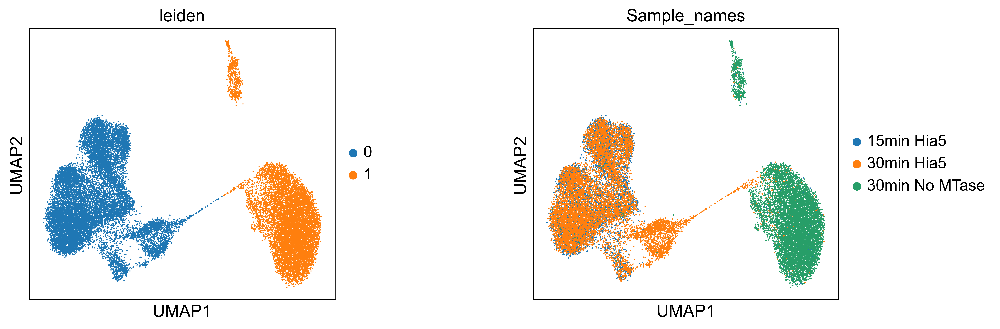

In [21]:
## Plotting higher dimensional analyses u ##

## Parameters ##
# pairwise_vmax_value = 1.1 # Maximal pairwise value to use in the pairwise heatmap colorbar
show_scanpy_plots = True
save_scanpy_plots = False
umap_obs_to_plot = ['leiden', 'Sample_names']
n_neighbors = 30 # Number of neighbors for the neighborhood graph
leiden_resolution = 0.02 # Resolution value for leiden clustering. Higher value generates more clusters
adata_suffix = '_subset_filtered_methylation_filtered'
#################

if show_scanpy_plots:
    import scanpy as sc
    # set scanpy parameters
    sc.settings.verbosity = 0             # verbosity: errors (0), warnings (1), info (2), hints (3)
    sc.logging.print_header()
    sc.settings.set_figure_params(dpi=300, facecolor='white')

    # Calculate QC metrics     
    sc.pp.calculate_qc_metrics(adata, percent_top=None, log1p=True, inplace=True) # Calculates QC metrics

    ## Scale the data and perform PCA ##
    sc.pp.scale(adata)
    sc.tl.pca(adata, svd_solver='arpack')
    #sc.pl.pca_scatter(adata_subset)

    ## compute the neighborhood graph of cells using the PCA representation of the data matrix ##
    n_pcs = 20
    if len(adata.var) < n_pcs:
        n_pcs = len(adata.var) // 2
    if len(adata.obs) < n_neighbors*2:
        n_neighbors = len(adata.obs) // 2
    sc.pp.neighbors(adata, n_neighbors=n_neighbors, n_pcs=n_pcs, use_rep='X_pca')

    ## Leiden graph-clustering method ##
    sc.tl.leiden(adata, resolution=leiden_resolution)

    ## Compute UMAP ##
    sc.tl.umap(adata)
    if save_scanpy_plots:
        save_name = cwd + '/{0}_{1} UMAP {2} {3} {4}_{5}'.format(date_string, sample_names[j], interaction_II[pairwise_combinations], dataset, lower_bound, upper_bound)
        sc.pl.umap(adata, color=umap_obs_to_plot, wspace=0.5, save=save_name)
    else: 
        sc.pl.umap(adata, color=umap_obs_to_plot, wspace=0.5)